<h2>Section A</h2>

In this section I want to explore our data and it's values in order to know how to handle our data in the pre-processing section.
I will provide some explaination about our data

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
from sklearn.metrics import mean_squared_error
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist
from sklearn.mixture import GaussianMixture
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import plot_confusion_matrix
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import plot_confusion_matrix
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import AdaBoostClassifier
import scipy.stats as stats
from scipy.stats import chi2_contingency
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest, f_classif
from scipy.stats import chi2_contingency
from sklearn.metrics import accuracy_score
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

RSEED=10

<h3>First of all let's import the datasets</h3>

In [2]:
aisles = pd.read_csv('aisles.csv')
departments = pd.read_csv('departments.csv')
order_products__prior= pd.read_csv('order_products__prior.csv')
order_products__train_test = pd.read_csv('order_products__train_test.csv')
orders = pd.read_csv('orders.csv')
products = pd.read_csv('products.csv')
target = pd.read_csv('target.csv')


<h3>Now exploring our datasets</h3>

In [3]:
aisles.head()

,aisle_id,aisle
0,1,prepared soups salads
1,2,specialty cheeses
2,3,energy granola bars
3,4,instant foods
4,5,marinades meat preparation


In [4]:
departments.head()

,department_id,department
0,1,frozen
1,2,other
2,3,bakery
3,4,produce
4,5,alcohol


In [5]:
order_products__prior.head()

,order_id,product_id,add_to_cart_order,reordered
0,2,33120,1,1
1,2,28985,2,1
2,2,9327,3,0
3,2,45918,4,1
4,2,30035,5,0


In [6]:
order_products__train_test.head()

,order_id,product_id,add_to_cart_order,reordered
0,1,49302,1,1
1,1,11109,2,1
2,1,10246,3,0
3,1,49683,4,0
4,1,43633,5,1


In [18]:
orders.head()

,order_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order
0,2539329,1,prior,1,2,8,NaN
1,2398795,1,prior,2,3,7,15.0
2,473747,1,prior,3,3,12,21.0
3,2254736,1,prior,4,4,7,29.0
4,431534,1,prior,5,4,15,28.0


In [19]:
products.head()

,product_id,product_name,aisle_id,department_id
0,1,Chocolate Sandwich Cookies,61,19
1,2,All-Seasons Salt,104,13
2,3,Robust Golden Unsweetened Oolong Tea,94,7
3,4,Smart Ones Classic Favorites Mini Rigatoni Wit...,38,1
4,5,Green Chile Anytime Sauce,5,13


In [21]:
target.head()

,order_id,product_id,was_in_order
0,1187899,196.0,1
1,2757217,196.0,1
2,632715,196.0,1
3,1167274,196.0,1
4,3347074,196.0,1


<h3>This func to display null,unique,type of every col in the dataset</h3>

In [25]:
def info_table(dataset):
    dataF = pd.DataFrame()
    for col in dataset.columns:
        tempDic = {}
        tempDic["name"] = col
        tempDic["null"] = dataset[col].isnull().sum()
        tempDic["unique"] = len(dataset[col].unique())
        tempDic["type"] = dataset[col].dtype.name
        dataF = dataF.append(tempDic, ignore_index=True)
    return dataF

In [28]:
info_table(aisles)

,name,null,unique,type
0,aisle_id,0,134,int64
1,aisle,0,134,object


In [29]:
info_table(departments)

,name,null,unique,type
0,department_id,0,21,int64
1,department,0,21,object


In [31]:
info_table(order_products__prior)

,name,null,unique,type
0,order_id,0,3214874,int64
1,product_id,0,49677,int64
2,add_to_cart_order,0,145,int64
3,reordered,0,2,int64


In [32]:
info_table(order_products__train_test)

,name,null,unique,type
0,order_id,0,131209,int64
1,product_id,0,39123,int64
2,add_to_cart_order,0,80,int64
3,reordered,0,2,int64


In [33]:
info_table(orders)

,name,null,unique,type
0,order_id,0,3346083,int64
1,user_id,0,206209,int64
2,eval_set,0,3,object
3,order_number,0,100,int64
4,order_dow,0,7,int64
5,order_hour_of_day,0,24,int64
6,days_since_prior_order,206209,32,float64


In [34]:
info_table(products)

,name,null,unique,type
0,product_id,0,49688,int64
1,product_name,0,49688,object
2,aisle_id,0,134,int64
3,department_id,0,21,int64


In [35]:
info_table(target)

,name,null,unique,type
0,order_id,0,131209,int64
1,product_id,0,49653,float64
2,was_in_order,0,2,int64


<h3>Transformation:One hot encoding(part of section B solution)</h3>

In [3]:
# Apply one-hot encoding to the 'eval_set' column
one_hot = pd.get_dummies(orders['eval_set'])

# Add the one-hot encoded columns to the dataframe
orders = pd.concat([orders, one_hot], axis=1)

# Drop the original 'eval_set' column
orders = orders.drop('eval_set', axis=1)

# Print the updated dataframe
print(orders.head())


   order_id  user_id  order_number  order_dow  order_hour_of_day  \
0   2539329        1             1          2                  8   
1   2398795        1             2          3                  7   
2    473747        1             3          3                 12   
3   2254736        1             4          4                  7   
4    431534        1             5          4                 15   

   days_since_prior_order  prior  test  train  
0                     NaN      1     0      0  
1                    15.0      1     0      0  
2                    21.0      1     0      0  
3                    29.0      1     0      0  
4                    28.0      1     0      0  


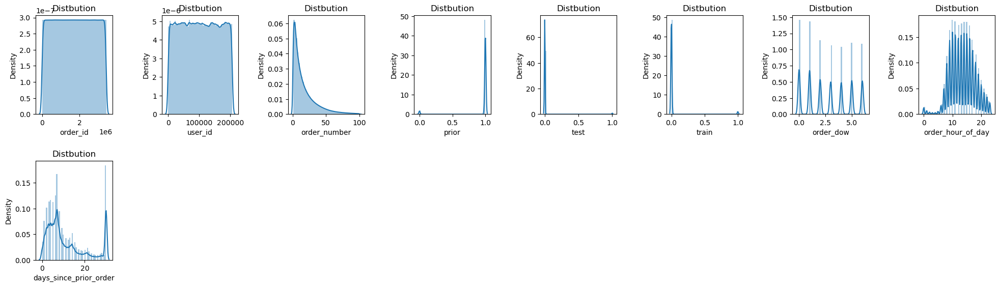

In [4]:
#orders dataset
cols = ['order_id', 'user_id', 'order_number','prior','test','train', 'order_dow' ,'order_hour_of_day', 'days_since_prior_order']
plt.figure(figsize=(20, 6))
for idx, col in enumerate(cols):
    plt.subplot(2, 8, idx + 1)
    plt.title("Distbution")
    sns.distplot(orders[col])
plt.tight_layout(pad=2, h_pad=2)
plt.show()

<h4>From the results I can see that there are some features that distbute nearly normally and others that distrbute right asymmetrically or destibuations.</h4>

<h4> Now I will display boxplot plots , so it will give us a vision about statistical information such as outliers,Q1,Q2...</h4>

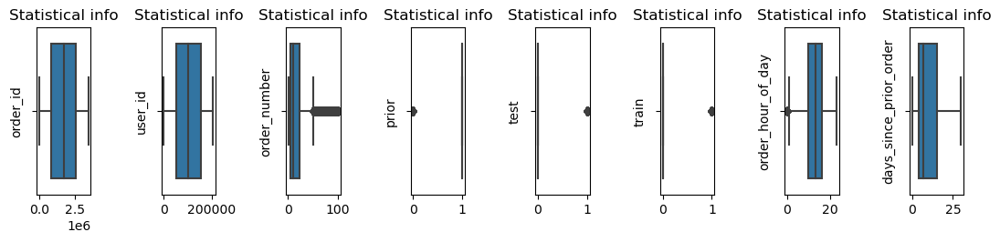

In [5]:
#orders_dataset
cols = ['order_id', 'user_id', 'order_number','prior','test','train' ,'order_hour_of_day', 'days_since_prior_order']
plt.figure(figsize=(11, 5))
for index, col in enumerate(cols):
    plt.subplot(2, 8, index + 1)
    sns.boxplot(orders[col], whis=1.5)
    plt.xlabel("")
    plt.ylabel(col)
    plt.title("Statistical info")
plt.tight_layout(pad=2, h_pad=1)
plt.show()


<h3>Here I want to see the relationships between the variables of our datasets ,by this plot wIe will get
more info about the relationship (linear, quadric, no relationship, etc.)</h3>

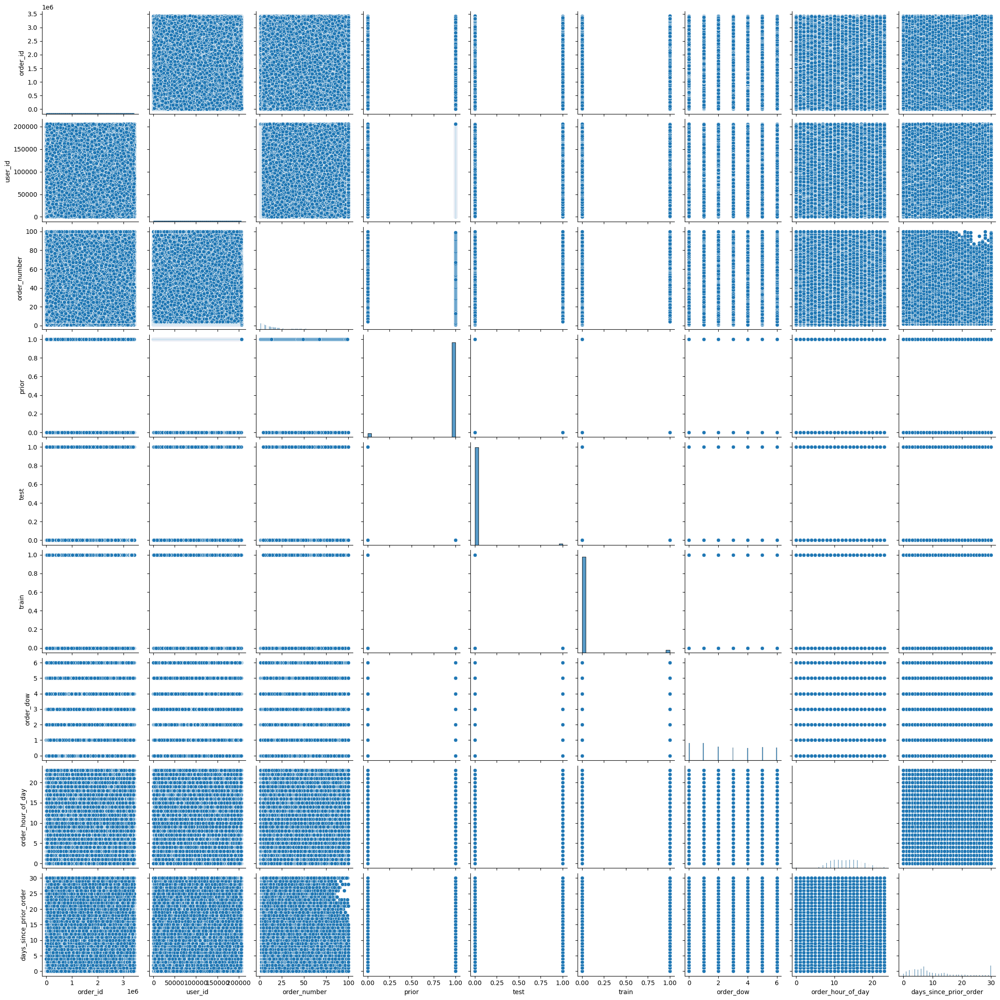

In [5]:
#orders
cols = ['order_id', 'user_id', 'order_number','prior','test','train', 'order_dow' ,'order_hour_of_day', 'days_since_prior_order']
sns.pairplot(orders[cols])
plt.show()

<h3>Now I will display some vis that include content which would be meaningful for a “ShufersalML” manage</h3> 

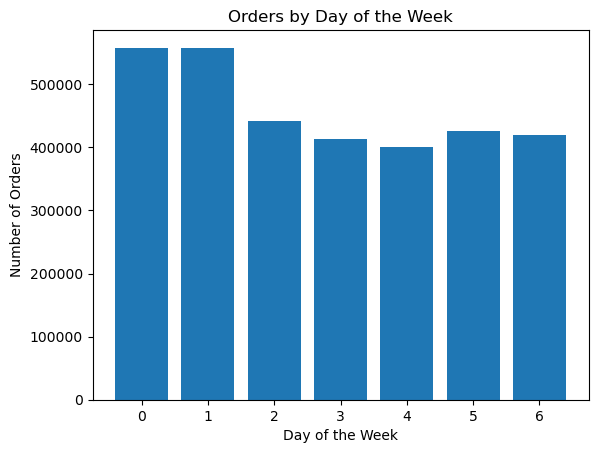

In [9]:
merged = pd.merge(orders, order_products_prior, on="order_id")

# Calculate the number of orders by day of the week
orders_by_day = merged.groupby("order_dow")["order_id"].nunique()

# Create a bar chart
plt.bar(orders_by_day.index, orders_by_day.values)

# Set the chart title, x-axis label, and y-axis label
plt.title("Orders by Day of the Week")
plt.xlabel("Day of the Week")
plt.ylabel("Number of Orders")

# Show the chart
plt.show()

<h4>This visualization describe order frequency by day of the week(0: "Sunday", 1: "Monday", 2: "Tuesday", 3: "Wednesday",...etc)
I bulid s bar chart showing the number of orders placed on each day of the week that could help the manager to know whether  days are more popular for grocery delivery than others.For example:he will know whether days to brings more employees or to get contacts with the supliers to get more goods.</h4>

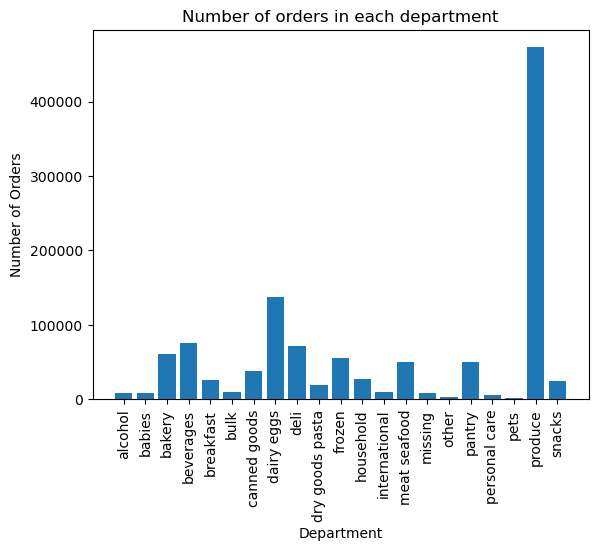

In [12]:
# Merge the order_products_prior and products files on product_id
order_fq = pd.merge(order_products_prior, products, on="product_id")

# Merge the merged and departments files on department_id
order_fq = pd.merge(order_fq, departments, on="department_id")

# Calculate the most commonly ordered product by department
most_common = order_fq.groupby(["department", "product_name"])["order_id"].count().reset_index()
most_common = most_common.sort_values(["department", "order_id"], ascending=[True, False])
most_common = most_common.groupby("department").first().reset_index()

# Create a bar chart
plt.bar(most_common["department"], most_common["order_id"])

# Set the chart title, x-axis label, and y-axis label
plt.title("Number of orders in each department")
plt.xlabel("Department")
plt.ylabel("Number of Orders")

# Rotate the x-axis labels
plt.xticks(rotation=90)

# Show the chart
plt.show()


<h4>This visulization display for each department how much products they sell, so it can help for the company to identify which departments to prioritize for marketing or promotions,and how much to order from the supliers.</h4>

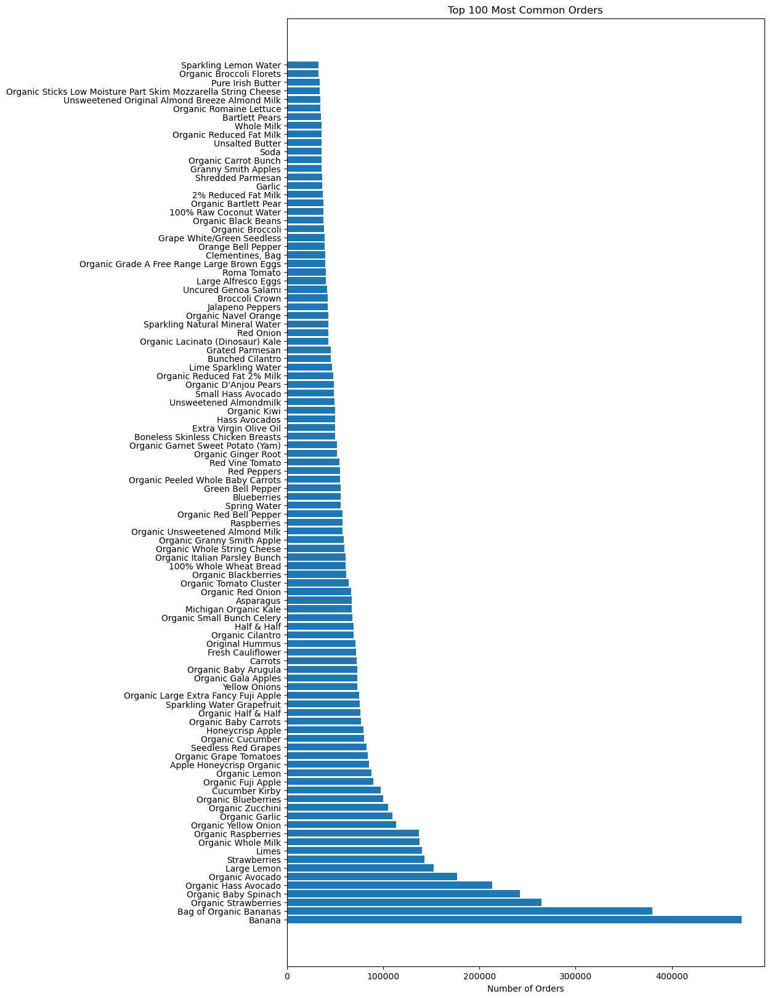

In [15]:
merged = pd.merge(order_products_prior, products, on="product_id")

# Count the number of times each product is ordered
product_counts = merged["product_name"].value_counts().head(100)

# Create a horizontal bar chart
fig, ax = plt.subplots(figsize=(10, 20))
ax.barh(product_counts.index, product_counts.values)

# Set the chart title and x-axis label
ax.set_title("Top 100 Most Common Orders")
ax.set_xlabel("Number of Orders")

# Show the chart
plt.show()


<h4>This graph display the 100 common products that cutomers order, this can be meaningful to know what is the most ordered products,also to know what are the products the bring revenue and other benefits.</h4>

<h4>This vis shows which hours in each day the customers are buy in the grocery ,this can help identify if certain hours of the day are more popular for purchases than others</h4>

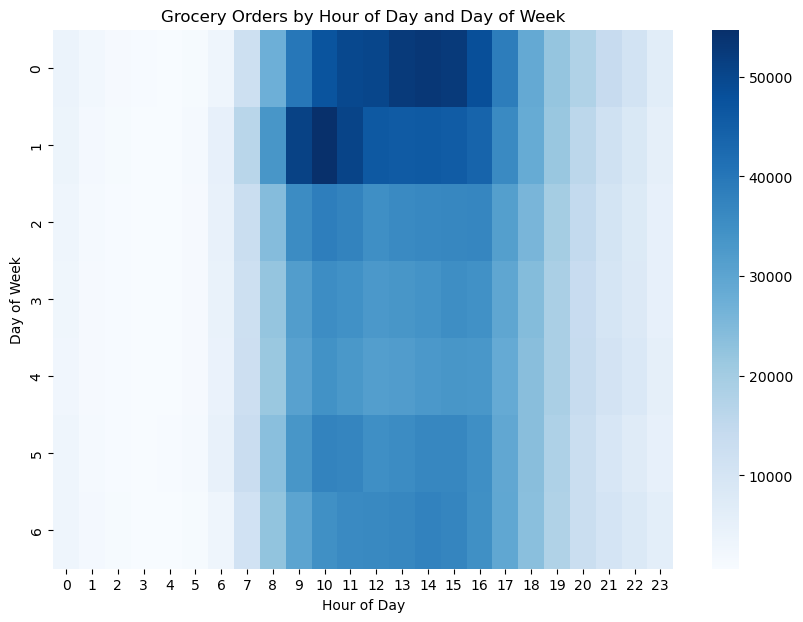

In [7]:
# Aggregate the orders data by day of the week and hour of the day
hourly_orders = orders.groupby(['order_dow', 'order_hour_of_day']).size().reset_index(name='count')

# Pivot the data to create a matrix of counts by day and hour
hourly_orders = hourly_orders.pivot(index='order_dow', columns='order_hour_of_day', values='count')

# Create a heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(hourly_orders, cmap='Blues')
plt.title('Grocery Orders by Hour of Day and Day of Week')
plt.xlabel('Hour of Day')
plt.ylabel('Day of Week')
plt.show()


<h4>Popular products by aisle feature:I choose this feature so it could show which products that are most commonly ordered from different 10 aisles that have the most sells,so this can help to identify which products to prioritize for marketing or promotions.
</h4>

<Figure size 1200x600 with 0 Axes>

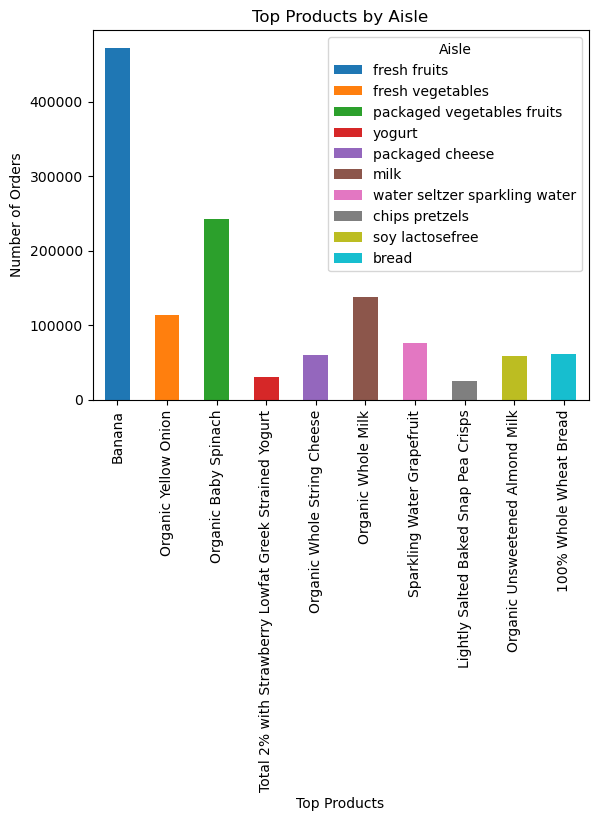

In [39]:
aisles_2=aisles 
aisles_2 = aisles_2.rename(columns={'islle': 'aisle'})

merged = pd.merge(order_products__prior, products, on='product_id', how='left')
merged = pd.merge(merged, aisles_2, on='aisle_id', how='left')

# Get the counts of products by aisle
aisle_counts = merged.groupby(['aisle'])['product_id'].count().reset_index(name='count')

# Get the top 10 aisles by count
top_10_aisles = aisle_counts.sort_values(by='count', ascending=False)[:10]

top_products = pd.DataFrame()
for aisle in top_10_aisles['aisle']:
    products_in_aisle = merged[merged['aisle'] == aisle]['product_name'].value_counts()[:1]
    top_products = pd.concat([top_products, products_in_aisle], axis=1)
top_products.columns = top_10_aisles['aisle']

# Plot the stacked bar chart
plt.figure(figsize=(12,6))
top_products.plot(kind='bar', stacked=True)
plt.xlabel('Top Products')
plt.ylabel('Number of Orders')
plt.title('Top Products by Aisle')
plt.legend(title='Aisle', bbox_to_anchor=(1, 1))
plt.show()


<h4>Displays the distribution of the "Reordered" feature in the "order_products__train_test" dataset<h4>

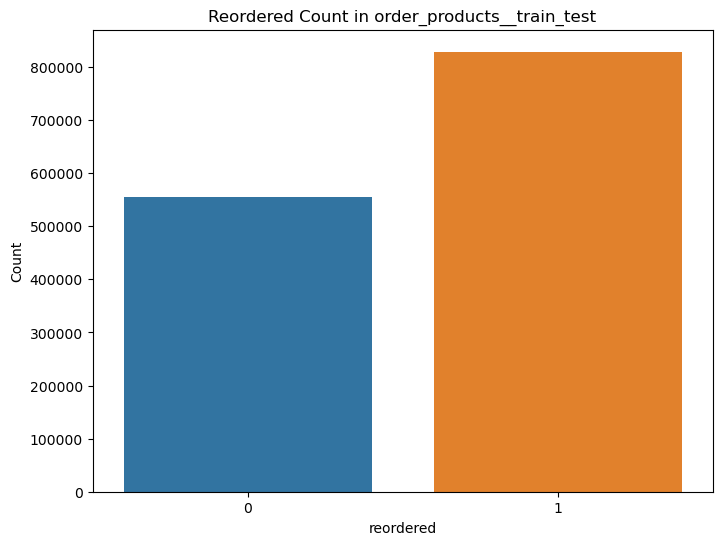

In [8]:
plt.figure(figsize=(8, 6))
sns.countplot(data=order_products__train_test, x='reordered')
plt.xlabel('reordered')
plt.ylabel('Count')
plt.title('Reordered Count in order_products__train_test')

# Show the plot
plt.show()

<h2>Section B</h2>

I have done transformations in section A.

<h3>Exclusion </h3>

In [4]:
order_products__prior.drop(['add_to_cart_order'], axis=1, inplace=True) 
order_products__train_test.drop(['add_to_cart_order'], axis=1, inplace=True)

I will continue to excluse in this section when we finish our features.

<h3>Imputation:I conclude that no need</h3>

In [5]:
orders.isna().sum()

order_id                       0
user_id                        0
order_number                   0
order_dow                      0
order_hour_of_day              0
days_since_prior_order    206209
prior                          0
test                           0
train                          0
dtype: int64

I see that days_since_prior_order there is null so I conclude that its the first order for this customer so I will fill it with 0.

In [6]:
orders["days_since_prior_order"] = orders["days_since_prior_order"].fillna(0)

In [7]:
orders.isna().sum()

order_id                  0
user_id                   0
order_number              0
order_dow                 0
order_hour_of_day         0
days_since_prior_order    0
prior                     0
test                      0
train                     0
dtype: int64

<h3>Weekday Purchase Probability Feature-product_weekday_prob</h3>

In [22]:
tomerge = pd.merge(order_products__prior, orders, on='order_id')
grouped = tomerge.groupby(['user_id', 'product_id', 'order_dow']).size().reset_index(name='order_count')

# Calculate the total number of unique order days for each user and product
unique_order_days = grouped.groupby(['user_id', 'product_id']).size().reset_index(name='unique_order_days')

# Merge the order count and unique order days dataframes
product_weekday_prob = pd.merge(grouped, unique_order_days, on=['user_id', 'product_id'])

# Calculate the weekday purchase probability
product_weekday_prob['weekday_purchase_prob'] = product_weekday_prob['order_count'] / product_weekday_prob['unique_order_days']

# Display the resulting dataframe
print(product_weekday_prob[['user_id', 'product_id', 'order_dow', 'weekday_purchase_prob']])


          user_id  product_id  order_dow  weekday_purchase_prob
0               1         196          1                   0.75
1               1         196          2                   0.50
2               1         196          3                   0.50
3               1         196          4                   0.75
4               1       10258          1                   0.75
...           ...         ...        ...                    ...
22637426   206209       44325          2                   1.00
22637427   206209       48370          4                   1.00
22637428   206209       48697          2                   1.00
22637429   206209       48742          1                   0.50
22637430   206209       48742          2                   0.50

[22637431 rows x 4 columns]


<h3>Product Purchase Frequency Feature-product_purchase_count</h3>

In [23]:
product_purchase_count = tomerge.groupby(['user_id', 'product_id'])['order_id'].count().reset_index()

product_purchase_count.rename(columns={'order_id': 'purchase_count'}, inplace=True)


In [24]:
product_purchase_count

,user_id,product_id,purchase_count
0,1,196,10
1,1,10258,9
2,1,10326,1
3,1,12427,10
4,1,13032,3
...,...,...,...
13307948,206209,43961,3
13307949,206209,44325,1
13307950,206209,48370,1
13307951,206209,48697,1


<h3>Days Since Last Order Feature-DaysSinceLastOrder_Feature</h3>

In [8]:
days2 = pd.merge(order_products__prior, orders, on='order_id')
prior_sorted = days2.sort_values(['user_id', 'order_number'])

# days_since_first_order indicating the days since the first order for each user-helper variable
prior_sorted['days_since_first_order'] = prior_sorted.groupby('user_id')['days_since_prior_order'].cumsum()

grouped1 = prior_sorted.groupby(['user_id', 'product_id']).last().reset_index()
grouped2 = prior_sorted.groupby(['user_id', 'product_id']).first().reset_index()

grouped1['Days_Since_Last_Order'] = grouped1['days_since_first_order'] - grouped2['days_since_prior_order']

grouped1

,user_id,product_id,order_id,reordered,order_number,order_dow,order_hour_of_day,days_since_prior_order,prior,test,train,days_since_first_order,Days_Since_Last_Order
0,1,196,2550362,1,10,4,8,30.0,1,0,0,854.0,854.0
1,1,10258,2550362,1,10,4,8,30.0,1,0,0,1004.0,989.0
2,1,10326,431534,0,5,4,15,28.0,1,0,0,480.0,452.0
3,1,12427,2550362,1,10,4,8,30.0,1,0,0,1094.0,1094.0
4,1,13032,2550362,1,10,4,8,30.0,1,0,0,1064.0,1049.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
13307948,206209,43961,626363,1,12,1,12,18.0,1,0,0,2109.0,2079.0
13307949,206209,44325,550836,0,7,2,13,9.0,1,0,0,1080.0,1071.0
13307950,206209,48370,1854736,0,11,4,10,30.0,1,0,0,1929.0,1899.0
13307951,206209,48697,550836,0,7,2,13,9.0,1,0,0,1062.0,1053.0


<h3>Now I will add other features that we chose</h3>

<h4>1)Average probability Reorder Rate: I choose this feature that help us to calculates the average probability of a product being reordered between all orders,so it can give us statics into which products have a high probibality of being purchased again,and to let us know the common products.-AverageprobabilityReorder</h4>

In [90]:
reorder_rates = tomerge.groupby('product_id')['reordered'].mean().reset_index()

# Sort the products by average reorder rate in descending order
AverageprobabilityReorder = reorder_rates.sort_values('reordered', ascending=False)
AverageprobabilityReorder.rename(columns={'reordered': 'reorder_rate'}, inplace=True)

print(AverageprobabilityReorder)


       product_id  reorder_rate
6430         6433      0.941176
2074         2075      0.931034
43545       43553      0.923077
27734       27740      0.920792
14605       14609      0.914286
...           ...           ...
38915       38923      0.000000
46224       46234      0.000000
19860       19864      0.000000
4324         4327      0.000000
39991       39999      0.000000

[49677 rows x 2 columns]


<h4>2)Department Frequency Feature: I choose this feature to see the number of times they(customers) purchased a number of products from a specific department so it can give us which departments are common between the customers and see for every user(customer) which the common department that he purchased from. -dept_purchase_count
</h4>

In [9]:
merged_df = pd.merge(order_products__prior, products, on='product_id')

merged_df = pd.merge(merged_df, orders, on='order_id')

dept_purchase_count = merged_df.groupby(['user_id', 'department_id'])['order_id'].count().reset_index()

dept_purchase_count.rename(columns={'order_id': 'purchase_count'}, inplace=True)


In [10]:
dept_purchase_count

,user_id,department_id,purchase_count
0,1,4,5
1,1,7,13
2,1,13,1
3,1,14,3
4,1,16,13
...,...,...,...
2232784,206209,15,7
2232785,206209,16,28
2232786,206209,17,14
2232787,206209,19,11


<h4>4)Days in week feature: by this feature  we can capture potential patterns in purchaseing behavior according to day in the week.For example: customers may order more on weekends that on weekdays.-day_of_week_count
</h4>

In [42]:
o1=orders[orders['prior']==1]
# group the data by order_dow and count the occurrences
day_of_week_count = o1.groupby('order_dow')['order_id'].count().reset_index()
# rename the 'order_id' column to 'order_count'
day_of_week_count.rename(columns={'order_id': 'order_count'}, inplace=True)

# calculate the percentage of total orders for each day of the week
total_orders = day_of_week_count['order_count'].sum()
day_of_week_count['order_percentage'] = day_of_week_count['order_count'] / total_orders * 100

day_of_week_count

,order_dow,order_count,order_percentage
0,0,557772,17.349731
1,1,556705,17.316542
2,2,441955,13.747195
3,3,412400,12.827874
4,4,401212,12.479867
5,5,425982,13.250348
6,6,418848,13.028442


<h4>5)Asiles Frequency Feature: I choose this feature to represents the number of times a customer has purchased a product from a a specific aisles.So it can give us which departments are popular among customers.-aisle_purchase_count
</h4>

In [11]:
# group the data by user_id and aisle_id, and count the occurrences
aisle_purchase_count = merged_df.groupby(['user_id', 'aisle_id'])['order_id'].count().reset_index()

# rename the 'order_id' column to 'purchase_count'
aisle_purchase_count = aisle_purchase_count.rename(columns={'order_id': 'purchase_count'})

# sort the dataframe by user_id and purchase_count
aisle_purchase_count = aisle_purchase_count.sort_values(['user_id', 'purchase_count'], ascending=[True, False])


In [12]:
aisle_purchase_count

,user_id,aisle_id,purchase_count
6,1,77,13
1,1,23,12
9,1,117,9
0,1,21,8
2,1,24,5
...,...,...,...
5729237,206209,107,1
5729239,206209,110,1
5729241,206209,114,1
5729242,206209,116,1


<h4>6)Time during the day feature: I choose this feature so it capture potential patterns in ordering behavior depending on the time of the day.For example, users(customers) may tend to buy more during afternoon and morning.-time_of_day_count//order_count +order_percentage
</h4>

In [9]:
m1 = orders.merge(order_products__prior, on='order_id').merge(products, on='product_id')

m1['Time of Day'] = pd.cut(m1['order_hour_of_day'], 
                               bins=[0,6,12,18,24], #0-night#6-morning#18-afternoon#24-evening
                               labels=['Night','Morning','Afternoon','Evening'])

# group the data by the 'Time of Day' and count the occurrences
time_of_day_count = m1.groupby(['Time of Day'])['order_id'].count().reset_index()

# rename the 'order_id' column to 'order_count'
time_of_day_count = time_of_day_count.rename(columns={'order_id':'order_count'})

# calculate the percentage of orders for each time of day
time_of_day_count['order_percentage'] = time_of_day_count['order_count'] / time_of_day_count['order_count'].sum() * 100

# display the results
print(time_of_day_count)


  Time of Day  order_count  order_percentage
0       Night       668681          2.075647
1     Morning     13192478         40.950664
2   Afternoon     14284219         44.339529
3     Evening      4070163         12.634160


<h4>7)Number of unique products purchased by every user feature: I choose this feature that can indicate the variety of products orderd by each user so users(customers) who buy a larger variety of products may be more good to the company and also more likely to reorder products.//unique_items_df
</h4>

In [13]:
tomerge = pd.merge(order_products__prior, orders, on='order_id')

unique_items_df = tomerge.groupby('user_id')['product_id'].nunique().reset_index()

unique_items_df = unique_items_df.rename(columns={'product_id': 'unique_items_purchased'})


In [14]:
unique_items_df

,user_id,unique_items_purchased
0,1,18
1,2,102
2,3,33
3,4,17
4,5,23
...,...,...
206204,206205,24
206205,206206,150
206206,206207,92
206207,206208,198


<h4>8)Average days between orders: here I calcuate the average number of days between each order placed by the customer-Average_days_between_orders</h4>

In [17]:
time_diff = o1.groupby('user_id')['days_since_prior_order'].mean().reset_index()

time_diff = time_diff.rename(columns={'days_since_prior_order': 'avg_days_between_orders'})

Average_days_between_orders = pd.DataFrame(time_diff)

Average_days_between_orders 

,user_id,avg_days_between_orders
0,1,17.600000
1,2,14.142857
2,3,11.083333
3,4,11.000000
4,5,10.000000
...,...,...
206204,206205,13.333333
206205,206206,3.716418
206206,206207,13.437500
206207,206208,7.285714


<h4>9)Preference day feature: here I display for evey customer the day that most likely to place an order-Day_of_week_preference_feature</h4>

In [18]:
dow_count=o1.groupby(['user_id', 'order_dow'])['order_id'].count().reset_index()

# Find the day of the week with the maximum number of orders for each user
max_dow = dow_count.groupby('user_id')['order_dow', 'order_id'].apply(lambda x: x.loc[x['order_id'].idxmax()]).reset_index()

# Rename the column
max_dow = max_dow.rename(columns={'order_dow': 'day_of_week_preference'})

# Create the customer behavior dataframe
Day_of_week_preference_feature = pd.DataFrame(max_dow[['user_id', 'day_of_week_preference']])

print(Day_of_week_preference_feature)

        user_id  day_of_week_preference
0             1                       1
1             2                       1
2             3                       0
3             4                       4
4             5                       3
...         ...                     ...
206204   206205                       2
206205   206206                       0
206206   206207                       0
206207   206208                       2
206208   206209                       1

[206209 rows x 2 columns]


<h4>10.Average time of the day: here I calcuate the average time of day in hours when the customer places an order.-avg_hour_of_day</h4>

In [19]:
avg_hour_of_day = o1.groupby('user_id')['order_hour_of_day'].mean().reset_index()
avg_hour_of_day.columns = ['user_id', 'avg_hour_of_day']
avg_hour_of_day

,user_id,avg_hour_of_day
0,1,10.300000
1,2,10.571429
2,3,16.416667
3,4,12.600000
4,5,16.000000
...,...,...
206204,206205,14.333333
206205,206206,16.731343
206206,206207,12.500000
206207,206208,14.265306


<h4>11.The avge avg products in every order for each customer</h4>

In [20]:
order_products_count_1 = pd.merge(orders, order_products__prior, on='order_id', how='inner')

# Calculate the average number of products in every order for each customer
average_products_per_order = order_products_count_1.groupby('user_id')['product_id'].mean().reset_index()

# Rename the column
average_products_per_order.rename(columns={'product_id': 'avg_products_per_order'}, inplace=True)
average_products_per_order['avg_products_per_order'] = average_products_per_order['avg_products_per_order'].astype(int)


# Display the average products per order for each customer
print(average_products_per_order)
###I convert the avg into int (not float) beacuse u cant "buy half product!"

        user_id  avg_products_per_order
0             1                   17885
1             2                   25398
2             3                   27459
3             4                   23302
4             5                   22513
...         ...                     ...
206204   206205                   28724
206205   206206                   27728
206206   206207                   27029
206207   206208                   25954
206208   206209                   22312

[206209 rows x 2 columns]


<h4>12.The most common department for each user -I get help from the dept_purchase_count(feature 2) feature:most_frequent_department_for_each_user</h4>

In [21]:
most_frequent_department_idx = dept_purchase_count.groupby('user_id')['purchase_count'].idxmax()

most_frequent_department_for_each_user = dept_purchase_count.loc[most_frequent_department_idx, ['user_id', 'department_id']]

print(most_frequent_department_for_each_user)

         user_id  department_id
6              1             19
17             2             16
21             3              4
29             4              1
39             5              4
...          ...            ...
2232724   206205             16
2232728   206206              1
2232754   206207             16
2232760   206208              4
2232785   206209             16

[206209 rows x 2 columns]


<h4>13.The most common aisle for each user -I get help from the aisle_purchase_count(feature 5) feature:most_frequent_aisle_for_each_user</h4>

In [22]:
most_frequent_aisle_idx = aisle_purchase_count.groupby('user_id')['purchase_count'].idxmax()

most_frequent_aisle_for_each_user = aisle_purchase_count.loc[most_frequent_aisle_idx, ['user_id', 'aisle_id']]

print(most_frequent_aisle_for_each_user)

         user_id  aisle_id
6              1        77
43             2       120
48             3        24
64             4        38
90             5       123
...          ...       ...
5729048   206205       120
5729060   206206        37
5729120   206207        83
5729204   206208       123
5729212   206209        24

[206209 rows x 2 columns]


<h4>14.Product Name Length: The length of the product name-For example, shorter product names might be associated with more generic or basic items, while longer product names could indicate more specialized or descriptive products. <h/4>

In [51]:
product_Name_Length = products[['product_id', 'product_name']].copy()
product_Name_Length['Product Name Length'] = product_Name_Length['product_name'].apply(lambda x: len(x))
product_Name_Length=product_Name_Length.drop(columns=['product_name'])

print(product_Name_Length)


       product_id  Product Name Length
0               1                   26
1               2                   16
2               3                   36
3               4                   65
4               5                   25
...           ...                  ...
49683       49684                   41
49684       49685                   34
49685       49686                   16
49686       49687                   42
49687       49688                   22

[49688 rows x 2 columns]


<h4>15.Feature that show for each product the most Order_hour_of_day that users by it -most_common_hour</h4>

In [50]:
y = pd.merge(orders, order_products__prior, on='order_id', how='inner')

most_common_hour = y.groupby('product_id')['order_hour_of_day'].agg(lambda x: x.value_counts().idxmax()).reset_index()

most_common_hour.columns = ['product_id', 'most_common_hour']

print(most_common_hour)


       product_id  most_common_hour
0               1                10
1               2                11
2               3                11
3               4                16
4               5                12
...           ...               ...
49672       49684                10
49673       49685                15
49674       49686                12
49675       49687                12
49676       49688                11

[49677 rows x 2 columns]


<h4>16.Feature to divid each product to catagory(vegetable,fruit,chocolate_candy,others)-df1 </h4>

In [98]:
df1=products
vegetables_keywords = [
    'carrot', 'tomato', 'potato', 'cucumber', 'broccoli', 'spinach',
    'lettuce', 'cabbage', 'bell pepper', 'zucchini', 'celery',
    'cauliflower', 'asparagus', 'green beans', 'Brussels sprouts',
    'kale', 'radish', 'onion', 'garlic'
]

fruits_keywords = [
    'apple', 'orange', 'banana', 'strawberry', 'pineapple', 'mango',
    'grapefruit', 'watermelon', 'blueberry', 'raspberry', 'lemon',
    'lime', 'peach', 'pear', 'kiwi', 'avocado', 'cherry', 'grape', 'melon'
]

chocolate_candy_keywords = [
    'chocolate', 'candy', 'chocolate bar', 'chocolate chip', 'candy bar',
    'candy cane', 'caramel', 'gummy bears', 'lollipop', 'marshmallow',
    'nougat', 'toffee', 'fudge', 'truffle'
]
df1['category'] = 'other'  # initialize all as 'other'
for index, row in df1.iterrows():
    product_name = row['product_name']
    if any(keyword in product_name.lower() for keyword in vegetables_keywords):
        df1.at[index, 'category'] = 'vegetable'
    elif any(keyword in product_name.lower() for keyword in fruits_keywords):
        df1.at[index, 'category'] = 'fruit'
    elif any(keyword in product_name.lower() for keyword in chocolate_candy_keywords):
        df1.at[index, 'category'] = 'chocolate'

df1=df1.drop(columns=['product_name','aisle_id','department_id'])
print(df1)

       product_id   category
0               1  chocolate
1               2      other
2               3      other
3               4      other
4               5      other
...           ...        ...
49683       49684      other
49684       49685      other
49685       49686      other
49686       49687      other
49687       49688      other

[49688 rows x 2 columns]


In [99]:
category_mapping = {'chocolate': 1, 'other': 2, 'fruit': 3, 'vegetable': 4}

df1['category_numeric'] = df1['category'].map(category_mapping)
df1=df1.drop(columns='category')
df1

,product_id,category_numeric
0,1,1
1,2,2
2,3,2
3,4,2
4,5,2
...,...,...
49683,49684,2
49684,49685,2
49685,49686,2
49686,49687,2


<h4>17.I use product_purchase_count feature to get help by this feature to get the number of all purchase by all users </h4> 

In [48]:
product_purchase_count1 = product_purchase_count.groupby('product_id')['purchase_count'].sum()

print(product_purchase_count1)

product_id
1        1852
2          90
3         277
4         329
5          15
         ... 
49684       9
49685      49
49686     120
49687      13
49688      89
Name: purchase_count, Length: 49677, dtype: int64


<h2>Continue to exclusion</h2>

In [11]:
products.drop(['product_name'], axis=1, inplace=True) 
aisles.drop(['aisle'], axis=1, inplace=True)
departments.drop(['department'], axis=1, inplace=True)

<h2>Section C</h2>

In [19]:
features_SectionC=pd.DataFrame()
features_SectionC=pd.merge(target, orders,on=['order_id'], how='inner')
features_SectionC

,order_id,product_id,was_in_order,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order,prior,test,train
0,1187899,196.0,1,1,11,4,8,14.0,0,1,0
1,1187899,26088.0,1,1,11,4,8,14.0,0,1,0
2,1187899,26405.0,1,1,11,4,8,14.0,0,1,0
3,1187899,10258.0,1,1,11,4,8,14.0,0,1,0
4,1187899,13032.0,1,1,11,4,8,14.0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...
2959120,2839453,45066.0,0,170084,4,0,16,0.0,0,0,1
2959121,2839453,38434.0,0,170084,4,0,16,0.0,0,0,1
2959122,2839453,10070.0,0,170084,4,0,16,0.0,0,0,1
2959123,2839453,43006.0,0,170084,4,0,16,0.0,0,0,1


In [66]:
train = features_SectionC[features_SectionC['train'] == 1]
test = features_SectionC[features_SectionC['test'] == 1]

In [56]:
train

,order_id,product_id,was_in_order,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order,prior,test,train
38,632715,196.0,1,676,12,0,13,26.0,0,0,1
39,632715,21386.0,1,676,12,0,13,26.0,0,0,1
40,632715,20940.0,1,676,12,0,13,26.0,0,0,1
41,632715,49352.0,0,676,12,0,13,26.0,0,0,1
42,632715,22825.0,0,676,12,0,13,26.0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...
2959120,2839453,45066.0,0,170084,4,0,16,0.0,0,0,1
2959121,2839453,38434.0,0,170084,4,0,16,0.0,0,0,1
2959122,2839453,10070.0,0,170084,4,0,16,0.0,0,0,1
2959123,2839453,43006.0,0,170084,4,0,16,0.0,0,0,1


In [57]:
test

,order_id,product_id,was_in_order,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order,prior,test,train
0,1187899,196.0,1,1,11,4,8,14.0,0,1,0
1,1187899,26088.0,1,1,11,4,8,14.0,0,1,0
2,1187899,26405.0,1,1,11,4,8,14.0,0,1,0
3,1187899,10258.0,1,1,11,4,8,14.0,0,1,0
4,1187899,13032.0,1,1,11,4,8,14.0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...
2959094,1436696,13176.0,0,133393,31,6,9,3.0,0,1,0
2959095,1436696,22312.0,0,133393,31,6,9,3.0,0,1,0
2959096,1436696,11777.0,0,133393,31,6,9,3.0,0,1,0
2959097,1436696,14857.0,0,133393,31,6,9,3.0,0,1,0


In [58]:
#Days_Since_Last_Order feature
sorted_train = train.sort_values(['user_id', 'order_number'])
sorted_train['days_since_first_order'] = sorted_train.groupby('user_id')['days_since_prior_order'].cumsum()

g1 = sorted_train.groupby(['user_id', 'product_id']).last().reset_index()
g2 = sorted_train.groupby(['user_id', 'product_id']).first().reset_index()

g1['Days_Since_Last_Order'] = g1['days_since_first_order'] - g2['days_since_prior_order']
 

In [59]:
x=pd.merge(g1[['user_id', 'product_id', 'Days_Since_Last_Order']], product_purchase_count, on=['user_id','product_id']
           , how='inner')#purchase_count_x
train=pd.merge(train, x, on=['user_id','product_id'], how='inner')
train=pd.merge(train, product_weekday_prob, on=['user_id','product_id','order_dow'], how='inner')
train=pd.merge(train, Day_of_week_preference_feature, on=['user_id'], how='inner')#for each user
train=pd.merge(train, avg_hour_of_day, on=['user_id'], how='inner')#for each user
train=pd.merge(train, unique_items_df, on=['user_id'], how='inner')#for each user
train=pd.merge(train, product_purchase_count1, on=['product_id'], how='inner')#for each product purchase_count_y
train=pd.merge(train, most_common_hour, on=['product_id'], how='inner')#for each product
train=pd.merge(train, product_Name_Length, on=['product_id'], how='inner')#for each product
train = train.drop(columns=['prior','order_number','unique_order_days','train','test','order_count'])

In [62]:
#Days_Since_Last_Order feature
sorted_test = test.sort_values(['user_id', 'order_number'])
sorted_test['days_since_first_order'] = sorted_test.groupby('user_id')['days_since_prior_order'].cumsum()

g3 = sorted_test.groupby(['user_id', 'product_id']).last().reset_index()
g4 = sorted_test.groupby(['user_id', 'product_id']).first().reset_index()

g3['Days_Since_Last_Order'] = g3['days_since_first_order'] - g4['days_since_prior_order']
 

In [63]:
x=pd.merge(g3[['user_id', 'product_id', 'Days_Since_Last_Order']], product_purchase_count, on=['user_id','product_id']
           , how='inner')#purchase_count_x
test=pd.merge(test, x, on=['user_id','product_id'], how='inner')
test=pd.merge(test, product_weekday_prob, on=['user_id','product_id','order_dow'], how='inner')
test=pd.merge(test, Day_of_week_preference_feature, on=['user_id'], how='inner')#for each user
test=pd.merge(test, avg_hour_of_day, on=['user_id'], how='inner')#for each user
test=pd.merge(test, unique_items_df, on=['user_id'], how='inner')#for each user
test=pd.merge(test, product_purchase_count1, on=['product_id'], how='inner')#for each product purchase_count_y
test=pd.merge(test, most_common_hour, on=['product_id'], how='inner')#for each product
test=pd.merge(test, product_Name_Length, on=['product_id'], how='inner')#for each product
test = test.drop(columns=['prior','order_number','unique_order_days','train','test','order_count'])

In [64]:
X_train=train.drop(columns=['order_id','product_id','was_in_order','user_id','order_dow'])
y_train=train['was_in_order']
X_test=test.drop(columns=['order_id','product_id','was_in_order','user_id','order_dow'])
y_test=test['was_in_order']

In [72]:
def get_metrics(y_test, y_pred):
    
    actual_pos = y_test == 1
    actual_neg = y_test == 0
    
    # get confusion matrix
    mat = metrics.confusion_matrix(y_test, y_pred)
    true_neg, false_pos, false_neg, true_pos = mat.ravel()
    
    # calculate sensitivity and specificity
    sensitivity = round(true_pos / np.sum(actual_pos), 3)
    specificity = round(true_neg / np.sum(actual_neg), 3)
    
    return sensitivity, specificity

<h3>Gradient Boosting Regressor</h3>

In [23]:
gb = GradientBoostingClassifier(random_state=RSEED)

# define parameter grid
parameters_grid = {
    'learning_rate': [0.6, 0.7, 0.8, 0.9],
    'n_estimators' : [10, 11,12, 13],
    'criterion': ['friedman_mse', 'squared_error', 'mse']
}

# define grid search
grid_search = GridSearchCV(estimator=gb, param_grid=parameters_grid, cv=10)
# fit estimator
grid_search.fit(X_train,y_train)

# get best estimator
best_grad = grid_search.best_estimator_
preditions_best = best_grad.predict(X_test)
print(confusion_matrix(y_test, preditions_best))


[[398586  71957]
 [158342 257214]]


In [27]:
y_pred = best_grad.predict(X_test)
# calculate metrics
acc = round(accuracy_score(y_test, y_pred), 3)
sensitivity, specificity = get_metrics(y_test, y_pred)

# display metrics
gb1 = pd.DataFrame([acc, sensitivity, specificity]).T
gb1 = gb1.rename(index={0: 'Gradiant Boost'}, columns={0: 'Accuracy', 1: 'Sensitivity', 2: 'Specificity'})
gb1

,Accuracy,Sensitivity,Specificity
Gradiant Boost,0.74,0.619,0.847


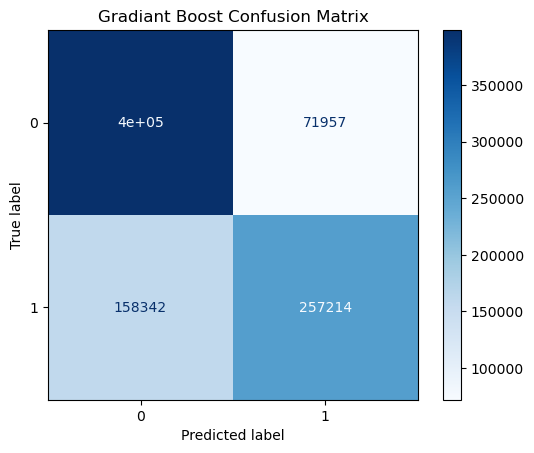

In [28]:
# plot confusion metrics
plot_confusion_matrix(best_grad, X_test, y_test, cmap='Blues')
plt.title("Gradiant Boost Confusion Matrix")
plt.show()

In [29]:
print('MSE:',(np.square(preditions_best - y_test)).mean()**0.5)

MSE: 0.5098059535360658


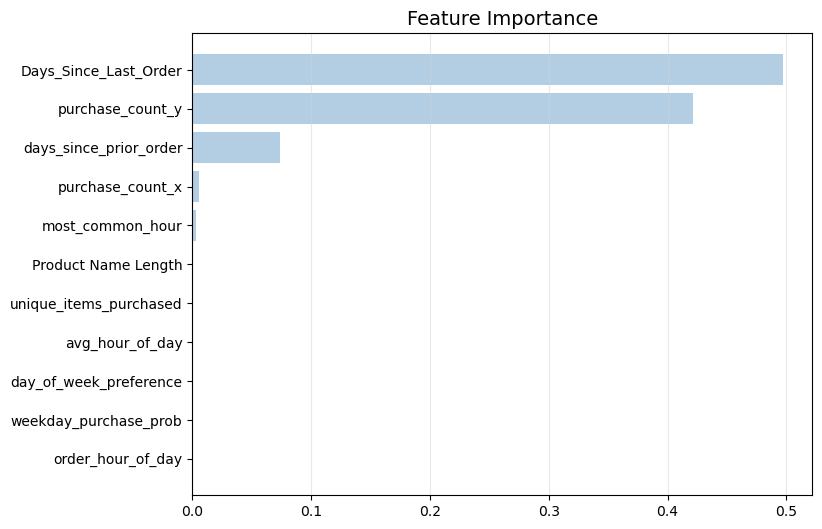

In [73]:
imp = pd.DataFrame(best_grad.fit(X_train, y_train).feature_importances_, 
                   index=X_train.columns, columns=['Importance']).sort_values('Importance')
# plot feature importance
plt.figure(figsize=(8, 6))
plt.barh(range(0, len(imp)), imp['Importance'], color='#b3cde3')
plt.grid(axis='x', alpha=0.5, color='lightgrey')
plt.yticks(range(0, len(imp)), imp.index)
plt.title('Feature Importance', fontsize=14)
plt.show()

<h3>Random Forst:</h3>

In [69]:
# define model
rf = RandomForestClassifier(random_state=RSEED)

# define parameter grid
parameters_grid = {
    'max_depth': [3],
    'min_samples_split': [2],
    'min_samples_leaf': [2],
    'n_estimators': [20]
}

# define grid search
grid_search = GridSearchCV(estimator=rf, param_grid=parameters_grid, cv=10)
# fit estimator
grid_search.fit(X_train, y_train)

# get best estimator
best = grid_search.best_estimator_

In [30]:
# define model
rf = RandomForestClassifier(random_state=RSEED)

# define parameter grid
parameters_grid = {
    'max_depth': [3, 4, 5],
    'min_samples_split': [2, 3, 4],
    'min_samples_leaf': [2, 4, 6],
    'n_estimators': [20, 50, 80]
}

# define grid search
grid_search = GridSearchCV(estimator=rf, param_grid=parameters_grid, cv=10)
# fit estimator
grid_search.fit(X_train, y_train)

# get best estimator
best = grid_search.best_estimator_

In [70]:
y_pred = best.predict(X_test)

In [33]:
y_pred = best.predict(X_test)
acc = round(accuracy_score(y_test, y_pred), 3)
sensitivity, specificity = get_metrics(y_test, y_pred)

# display metrics
df = pd.DataFrame([acc, sensitivity, specificity]).T
df = df.rename(index={0: 'Random Forst'}, columns={0: 'Accuracy', 1: 'Sensitivity', 2: 'Specificity'})
df

,Accuracy,Sensitivity,Specificity
Random Forst,0.706,0.548,0.845


In [34]:
print('MSE:',(np.square(y_pred - y_test)).mean()**0.5)

MSE: 0.5421780111511966


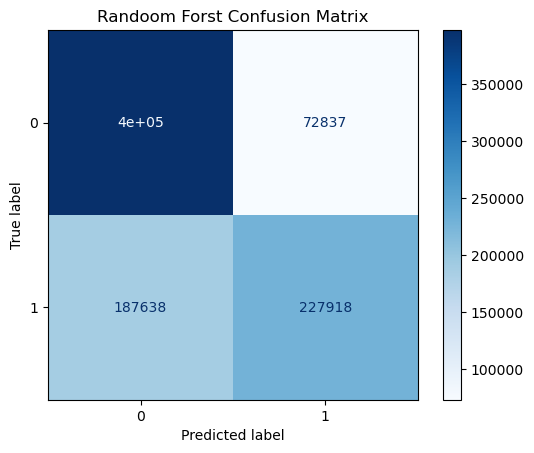

In [36]:
plot_confusion_matrix(best, X_test, y_test, cmap='Blues')
plt.title("Randoom Forst Confusion Matrix")
plt.show()

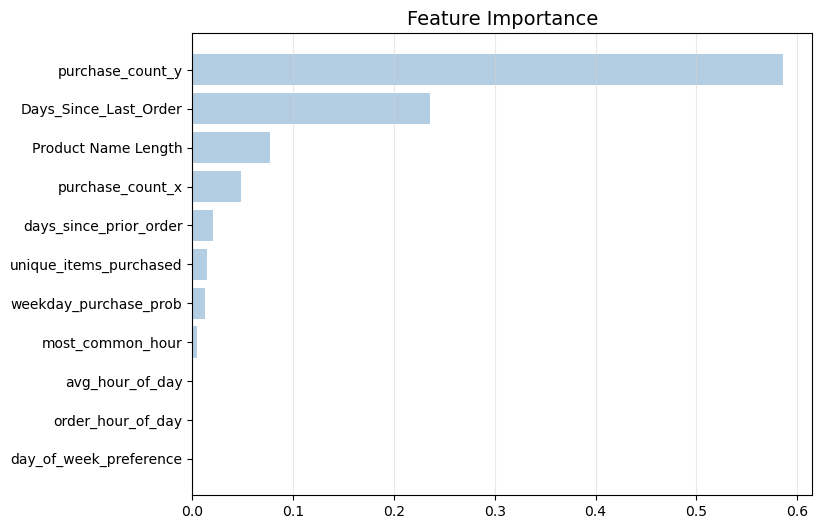

In [82]:
imp = pd.DataFrame(grid_search.best_estimator_.fit(X_train, y_train).feature_importances_, 
                   index=X_train.columns, columns=['Importance']).sort_values('Importance')
# plot feature importance
plt.figure(figsize=(8, 6))
plt.barh(range(0, len(imp)), imp['Importance'], color='#b3cde3')
plt.grid(axis='x', alpha=0.5, color='lightgrey')
plt.yticks(range(0, len(imp)), imp.index)
plt.title('Feature Importance', fontsize=14)
plt.show()

<h2>KNN</h2>

In [41]:
knn = KNeighborsClassifier()

# define parameter grid
parameters_grid = {
    'n_neighbors': [3, 5, 7, 9, 13, 15, 17, 19, 21, 23, 25],
    'weights': ['uniform', 'distance'],
    'p': [1, 2, 3]
}

# define grid search
grid_search = GridSearchCV(estimator=knn, param_grid=parameters_grid, cv=10)
# fit estimator
grid_search.fit(X_train, y_train)

# get best estimator
best = grid_search.best_estimator_

In [43]:
pd.DataFrame.from_dict(grid_search.best_params_, orient='index', columns=['Selected Value']).T

,n_neighbors,p,weights
Selected Value,3,3,distance


In [44]:
y_pred = best.predict(X_test)
# calculate metrics
acc = round(accuracy_score(y_test, y_pred), 3)
sensitivity, specificity = get_metrics(y_test, y_pred)

# display metrics
knn_df = pd.DataFrame([acc, sensitivity, specificity]).T
knn_df = knn_df.rename(index={0: 'KNN Classifier'}, columns={0: 'Accuracy', 1: 'Sensitivity', 2: 'Specificity'})
knn_df

,Accuracy,Sensitivity,Specificity
KNN Classifier,0.678,0.628,0.722


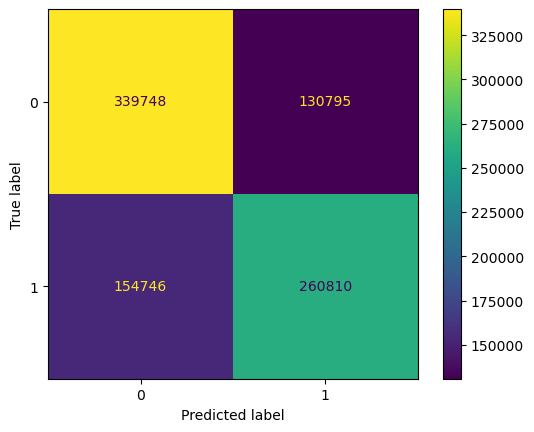

In [45]:
# Generate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create the ConfusionMatrixDisplay object
cmd = ConfusionMatrixDisplay(cm)

# Plot the confusion matrix
cmd.plot()
plt.show()

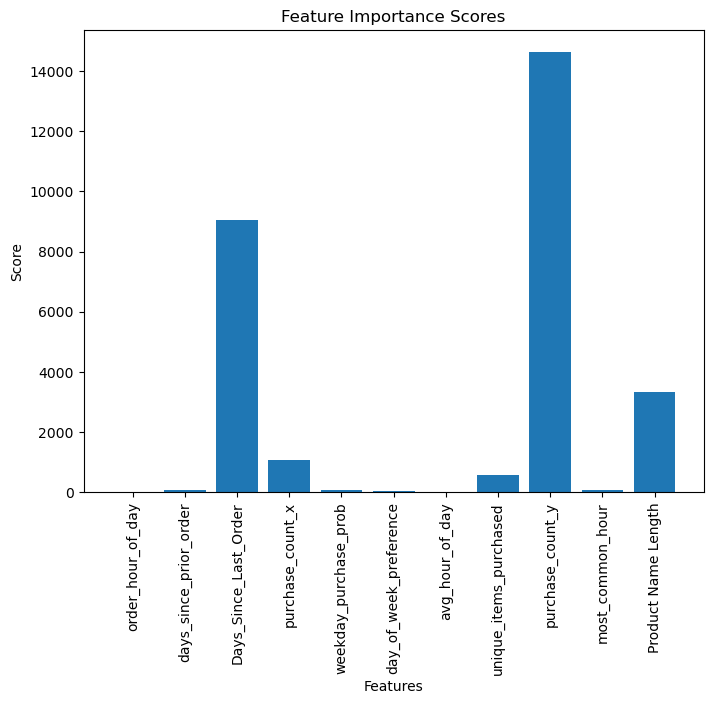

In [87]:
selector = SelectKBest(score_func=f_classif, k=5)

# Fit the selector to your training data
selector.fit(X_train, y_train)

# Get the scores of the features
scores = selector.scores_

# Get the names of the features
feature_names = X_train.columns

# Plot the feature importance scores
plt.figure(figsize=(8, 6))
plt.bar(feature_names, scores)
plt.xticks(rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Score')
plt.title('Feature Importance Scores')
plt.show()

<h3>AdaBoost </h3>

In [31]:
# define model
gb = AdaBoostClassifier(random_state=RSEED)

# define parameter grid
parameters_grid = {
    'learning_rate': [1.0],
    'n_estimators' : [15],
    'algorithm' : ['SAMME.R']
}

# define grid search
grid_search = GridSearchCV(estimator=gb, param_grid=parameters_grid, cv=10)
# fit estimator
grid_search.fit(X_train,y_train)

# get best estimator
best_tree_ada = grid_search.best_estimator_
preditions_best = best_tree_ada.predict(X_test)
print(confusion_matrix(y_test, preditions_best))

[[400568  69975]
 [166617 248939]]


In [32]:
y_pred = best_tree_ada.predict(X_test)
# calculate metrics
acc = round(accuracy_score(y_test, y_pred), 3)
sensitivity, specificity = get_metrics(y_test, y_pred)

# display metrics
x = pd.DataFrame([acc, sensitivity, specificity]).T
x = x.rename(index={0: 'Adaboost'}, columns={0: 'Accuracy', 1: 'Sensitivity', 2: 'Specificity'})
x

,Accuracy,Sensitivity,Specificity
Adaboost,0.733,0.599,0.851


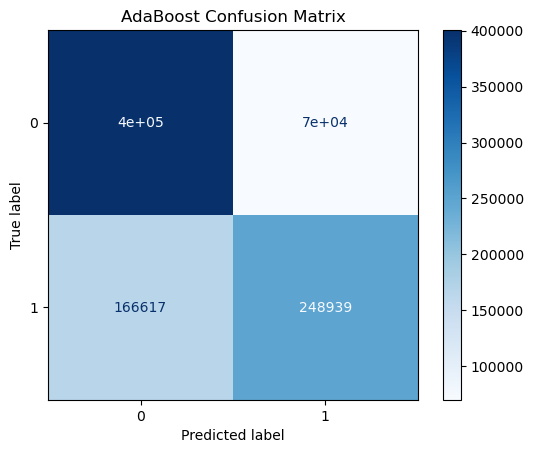

In [33]:
# plot confusion metrics
plot_confusion_matrix(best_tree_ada, X_test, y_test, cmap='Blues')
plt.title("AdaBoost Confusion Matrix")
plt.show()

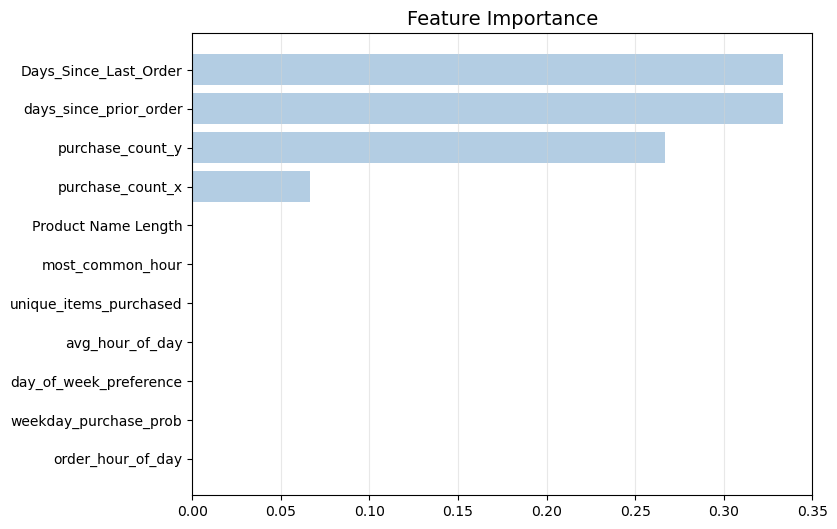

In [94]:
imp = pd.DataFrame(best_tree_ada.fit(X_train, y_train).feature_importances_, 
                   index=X_train.columns, columns=['Importance']).sort_values('Importance')
# plot feature importance
plt.figure(figsize=(8, 6))
plt.barh(range(0, len(imp)), imp['Importance'], color='#b3cde3')
plt.grid(axis='x', alpha=0.5, color='lightgrey')
plt.yticks(range(0, len(imp)), imp.index)
plt.title('Feature Importance', fontsize=14)
plt.show()

As I see from the results that every algorithm has his own accuracy ,but the best is Gradiant Boost (bythe weighted avg and accuracy/Sensitivity/Specificity) I can see that they very close to each other but when I see the features importance I see the differens more.                         

<h2>Section D</h2>

In [23]:
#features from section B that relate to costumers
#avg_days_between_orders,day_of_week_preference,avg_time_of_day,unique_items_df,average_products_per_order
##,most_frequent_aisle_for_each_user,most_frequent_department_for_each_user
custmers_features1=pd.DataFrame()
custmers_features1=pd.merge(Average_days_between_orders, avg_hour_of_day, on='user_id', how='inner')
custmers_features1=pd.merge(custmers_features1, Day_of_week_preference_feature, on='user_id', how='inner')
custmers_features1=pd.merge(custmers_features1, unique_items_df, on='user_id', how='inner')
custmers_features1=pd.merge(custmers_features1, average_products_per_order, on='user_id', how='inner')
custmers_features1=pd.merge(custmers_features1, most_frequent_department_for_each_user, on='user_id', how='inner')
custmers_features1=pd.merge(custmers_features1, most_frequent_aisle_for_each_user, on='user_id', how='inner')
custmers_features1

,user_id,avg_days_between_orders,avg_hour_of_day,day_of_week_preference,unique_items_purchased,avg_products_per_order,department_id,aisle_id
0,1,17.600000,10.300000,1,18,17885,19,77
1,2,14.142857,10.571429,1,102,25398,16,120
2,3,11.083333,16.416667,0,33,27459,4,24
3,4,11.000000,12.600000,4,17,23302,1,38
4,5,10.000000,16.000000,3,23,22513,4,123
...,...,...,...,...,...,...,...,...
206204,206205,13.333333,14.333333,2,24,28724,16,120
206205,206206,3.716418,16.731343,0,150,27728,1,37
206206,206207,13.437500,12.500000,0,92,27029,16,83
206207,206208,7.285714,14.265306,2,198,25954,4,123


In [32]:
def elbow_met(df):

    # k means determine k
    distortions = []
    K = range(1,10)
    for k in K:
        kmeanModel = KMeans(n_clusters=k).fit(df)
        kmeanModel.fit(df)
        distortions.append(sum(np.min(cdist(df, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / df.shape[0])

    # Plot the elbow
    plt.plot(K, distortions, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Within groups sum of squares')
    plt.title('The Elbow Method showing the optimal k')
    plt.show()

<h4>Let's find the optimal k by the elbow function</h4>

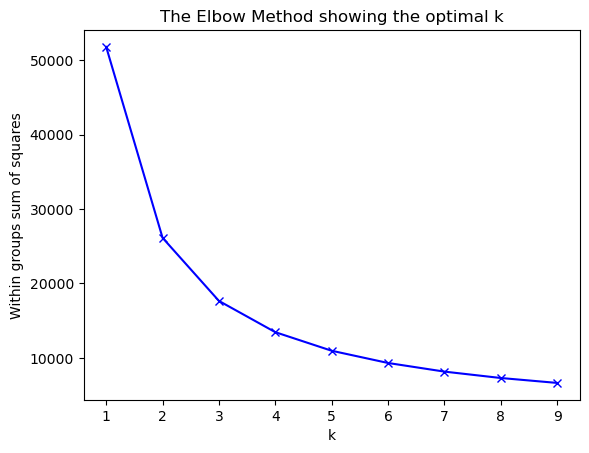

In [33]:
elbow_met(custmers_features1)

As we see in k=3 is the elbow value.

<h3>1.K means</h3


In [43]:
k_means1 = custmers_features1.drop(['user_id'], axis=1).copy()
k_means1

,avg_days_between_orders,avg_hour_of_day,day_of_week_preference,unique_items_purchased,avg_products_per_order,department_id,aisle_id
0,17.600000,10.300000,1,18,17885,19,77
1,14.142857,10.571429,1,102,25398,16,120
2,11.083333,16.416667,0,33,27459,4,24
3,11.000000,12.600000,4,17,23302,1,38
4,10.000000,16.000000,3,23,22513,4,123
...,...,...,...,...,...,...,...
206204,13.333333,14.333333,2,24,28724,16,120
206205,3.716418,16.731343,0,150,27728,1,37
206206,13.437500,12.500000,0,92,27029,16,83
206207,7.285714,14.265306,2,198,25954,4,123


In [73]:
# define model
k_means = KMeans(random_state=RSEED)

# define parameter grid
parameters_grid = {
      'n_clusters': [3],
    'init': ['k-means++', 'random'],
    'n_init' : [3,5,8,10],
    'max_iter' : [100, 150, 200]
}

# define grid search
grid_search = GridSearchCV(estimator=k_means, param_grid=parameters_grid, cv=10)
# fit estimator
grid_search.fit(k_means1)

# get best estimator
best_km = grid_search.best_estimator_
preditions_best_km = best_km.predict(k_means1)
best_km

KMeans(max_iter=100, n_clusters=3, n_init=3, random_state=10)

In [74]:
k_means1['cluster'] = preditions_best_km
k_means1

,avg_days_between_orders,avg_hour_of_day,day_of_week_preference,unique_items_purchased,avg_products_per_order,department_id,aisle_id,cluster
0,17.600000,10.300000,1,18,17885,19,77,2
1,14.142857,10.571429,1,102,25398,16,120,0
2,11.083333,16.416667,0,33,27459,4,24,1
3,11.000000,12.600000,4,17,23302,1,38,0
4,10.000000,16.000000,3,23,22513,4,123,0
...,...,...,...,...,...,...,...,...
206204,13.333333,14.333333,2,24,28724,16,120,1
206205,3.716418,16.731343,0,150,27728,1,37,1
206206,13.437500,12.500000,0,92,27029,16,83,1
206207,7.285714,14.265306,2,198,25954,4,123,0


In [75]:
cluster_new = pd.DataFrame()
cluster_0 = {}
cluster_1 = {}
cluster_2 = {}
clusters={}
for i in range(4):
    clusters['cluster_'+str(i)] = k_means1[k_means1['cluster' ]== i]

In [76]:
cluster_0['cluster_number'] = int(0)
cluster_0['users'] =clusters['cluster_0'].iloc[:,:0 ]
cluster_new = cluster_new.append(cluster_0, ignore_index=True)

cluster_1['cluster_number'] = int(1)
cluster_1['users'] = clusters['cluster_1'].iloc[:,:0 ]
cluster_new = cluster_new.append(cluster_1, ignore_index=True)

cluster_2['cluster_number'] = int(2)
cluster_2['users'] = clusters['cluster_2'].iloc[:,:0 ]
cluster_new = cluster_new.append(cluster_2, ignore_index=True)

cluster_new['cluster_number'] = cluster_new['cluster_number'].astype(int)


In [77]:
cluster_0['users']

""
1
3
4
8
11
...
206200
206201
206202
206203


In [78]:
cluster_1['users']

""
2
5
6
9
10
...
206196
206199
206204
206205


In [79]:
cluster_2['users']

""
0
7
14
16
19
...
206147
206157
206158
206194


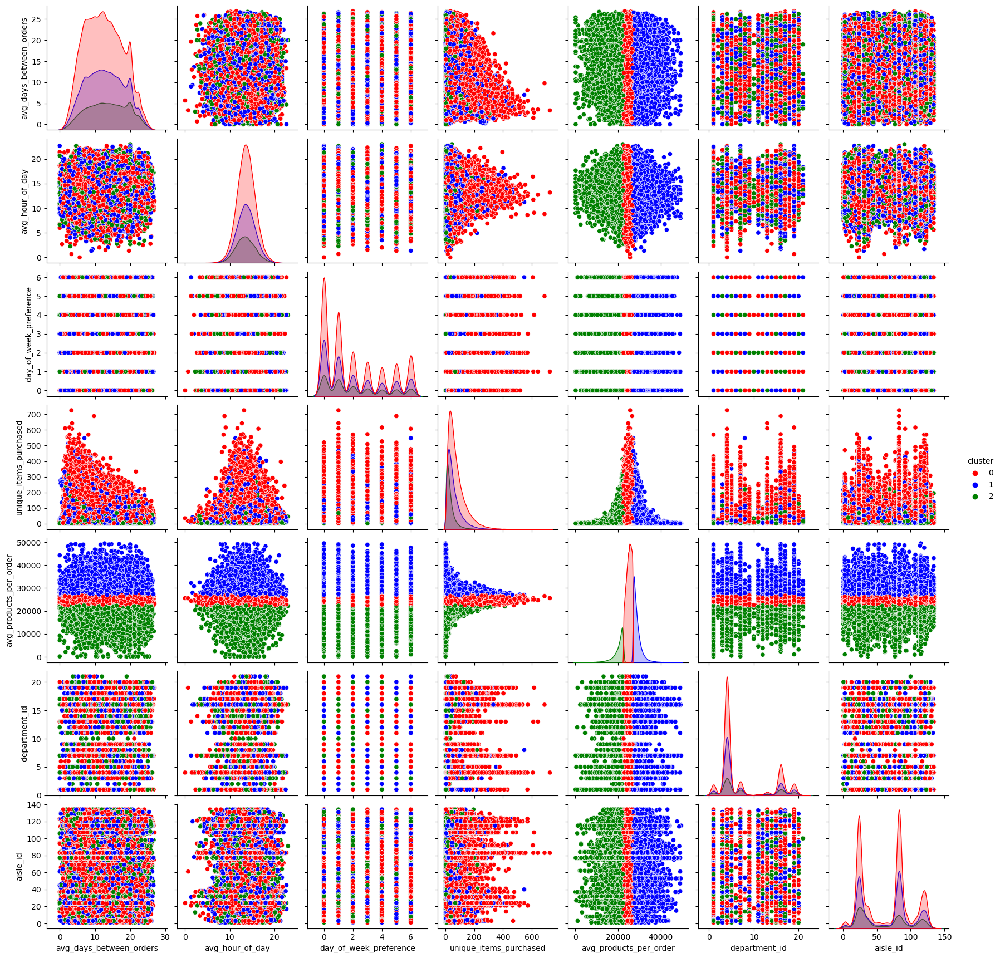

In [80]:
sns.pairplot(k_means1, hue='cluster', palette=['red', 'blue', 'green'])
plt.show()

As we see from the results,features like avg_days_between_orders feature and day of week prefernce feature we cant really cluster the customers,but for example unique item purchased feature we can see better the difference between the clusters,which we can coclude that it is the most important features that contribute to the differences between the clusters

Now to estimate the quality of the clusters created with the K-means algorithm, I will use the silhouette score. The silhouette score measures the compactness of each cluster and the separation between different clusters. Higher silhouette scores indicate better-defined and well-separated clusters.

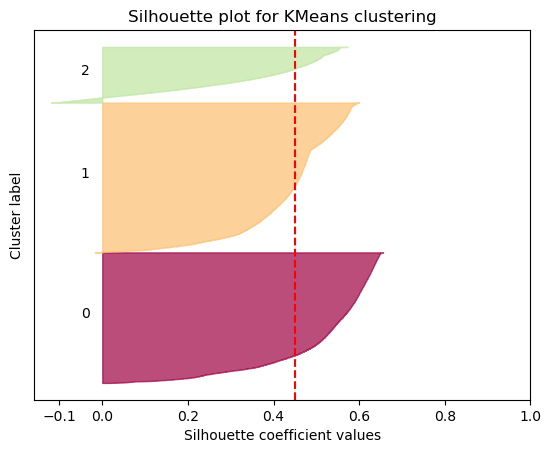

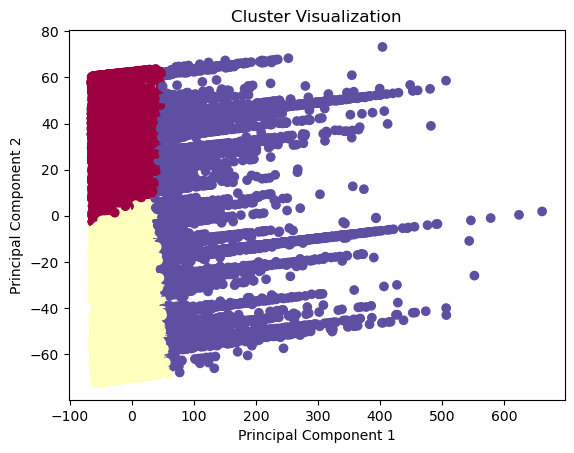

In [67]:
kmeans = KMeans(max_iter=100,n_init=3, n_clusters=3, random_state=RSEED,init='random')

labels = kmeans.fit_predict(k_means1)  # Replace 'data' with your actual data

# Compute silhouette scores
silhouette_avg = silhouette_score(k_means1, labels)
sample_silhouette_values = silhouette_samples(k_means1, labels)

# Plot silhouette scores
fig, ax = plt.subplots()
y_lower = 10
for i in range(3):
    ith_cluster_silhouette_values = sample_silhouette_values[labels == i]
    ith_cluster_silhouette_values.sort()
    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i
    color = plt.cm.get_cmap("Spectral")(i / 3)
    ax.fill_betweenx(np.arange(y_lower, y_upper),
                       0, ith_cluster_silhouette_values,
                       facecolor=color, edgecolor=color, alpha=0.7)
    ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
    y_lower = y_upper + 10

ax.set_xlabel("Silhouette coefficient values")
ax.set_ylabel("Cluster label")
ax.axvline(x=silhouette_avg, color="red", linestyle="--")
ax.set_yticks([])
ax.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
plt.title("Silhouette plot for KMeans clustering")
plt.show()

# Perform dimensionality reduction for visualization
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(k_means1)

# Plot cluster visualization
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=labels, cmap="Spectral")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("Cluster Visualization")
plt.show()


The silhouette coefficient value of indicates a moderate level of separation and compactness of the clusters. While it is not extremely high, it suggests that the clusters are reasonably distinct and relatively well-defined. This indicates a moderate quality of clusters.
And the cluster visualization between show the spread of clusters across a wide range in the visualization suggests that the clusters have varying positions and distributions, This can be an indication of the presence of diverse patterns and potentially meaningful subgroups within the data.

<h3>2.GMM</h3>

In [24]:
gmm1 = custmers_features1.drop(['user_id'], axis=1).copy()
gmm1

,avg_days_between_orders,avg_hour_of_day,day_of_week_preference,unique_items_purchased,avg_products_per_order,department_id,aisle_id
0,17.600000,10.300000,1,18,17885,19,77
1,14.142857,10.571429,1,102,25398,16,120
2,11.083333,16.416667,0,33,27459,4,24
3,11.000000,12.600000,4,17,23302,1,38
4,10.000000,16.000000,3,23,22513,4,123
...,...,...,...,...,...,...,...
206204,13.333333,14.333333,2,24,28724,16,120
206205,3.716418,16.731343,0,150,27728,1,37
206206,13.437500,12.500000,0,92,27029,16,83
206207,7.285714,14.265306,2,198,25954,4,123


In [25]:
gmm = GaussianMixture(random_state=RSEED)

# define parameter grid
parameters_grid = {
    'n_components': [3],
    'init_params': ['random', 'random_from_data'],
    'n_init' : [1, 3, 5, 8, 10],
}

# define grid search
grid_search = GridSearchCV(estimator=gmm, param_grid=parameters_grid, cv=10)
# fit estimator
grid_search.fit(gmm1)

# get best estimator
best_gmm = grid_search.best_estimator_
preditions_best_gmm = best_gmm.predict(gmm1)
gmm1['cluster'] = preditions_best_gmm
gmm1

,avg_days_between_orders,avg_hour_of_day,day_of_week_preference,unique_items_purchased,avg_products_per_order,department_id,aisle_id,cluster
0,17.600000,10.300000,1,18,17885,19,77,1
1,14.142857,10.571429,1,102,25398,16,120,0
2,11.083333,16.416667,0,33,27459,4,24,2
3,11.000000,12.600000,4,17,23302,1,38,2
4,10.000000,16.000000,3,23,22513,4,123,2
...,...,...,...,...,...,...,...,...
206204,13.333333,14.333333,2,24,28724,16,120,2
206205,3.716418,16.731343,0,150,27728,1,37,0
206206,13.437500,12.500000,0,92,27029,16,83,2
206207,7.285714,14.265306,2,198,25954,4,123,0


In [26]:
best_gmm

GaussianMixture(init_params='random', n_components=3, n_init=10,
                random_state=10)

In [27]:
cluster_gmm = pd.DataFrame()
cluster_0 = {}
cluster_1 = {}
cluster_2 = {}
clusters={}
for i in range(4):
    clusters['cluster_'+str(i)] = gmm1[gmm1['cluster' ]== i]

In [28]:
cluster_0['cluster_number'] = int(0)
cluster_0['users'] =clusters['cluster_0'].iloc[:,:0 ]
cluster_gmm = cluster_gmm.append(cluster_0, ignore_index=True)

cluster_1['cluster_number'] = int(1)
cluster_1['users'] = clusters['cluster_1'].iloc[:,:0 ]
cluster_gmm = cluster_gmm.append(cluster_1, ignore_index=True)

cluster_2['cluster_number'] = int(2)
cluster_2['users'] = clusters['cluster_2'].iloc[:,:0 ]
cluster_gmm = cluster_gmm.append(cluster_2, ignore_index=True)

cluster_gmm['cluster_number'] = cluster_gmm['cluster_number'].astype(int)


In [29]:
cluster_0['users']

""
1
13
18
26
27
...
206192
206198
206200
206205


In [30]:
cluster_1['users']

""
0
7
14
19
20
...
206149
206154
206157
206158


In [31]:
cluster_2['users']

""
2
3
4
5
6
...
206202
206203
206204
206206


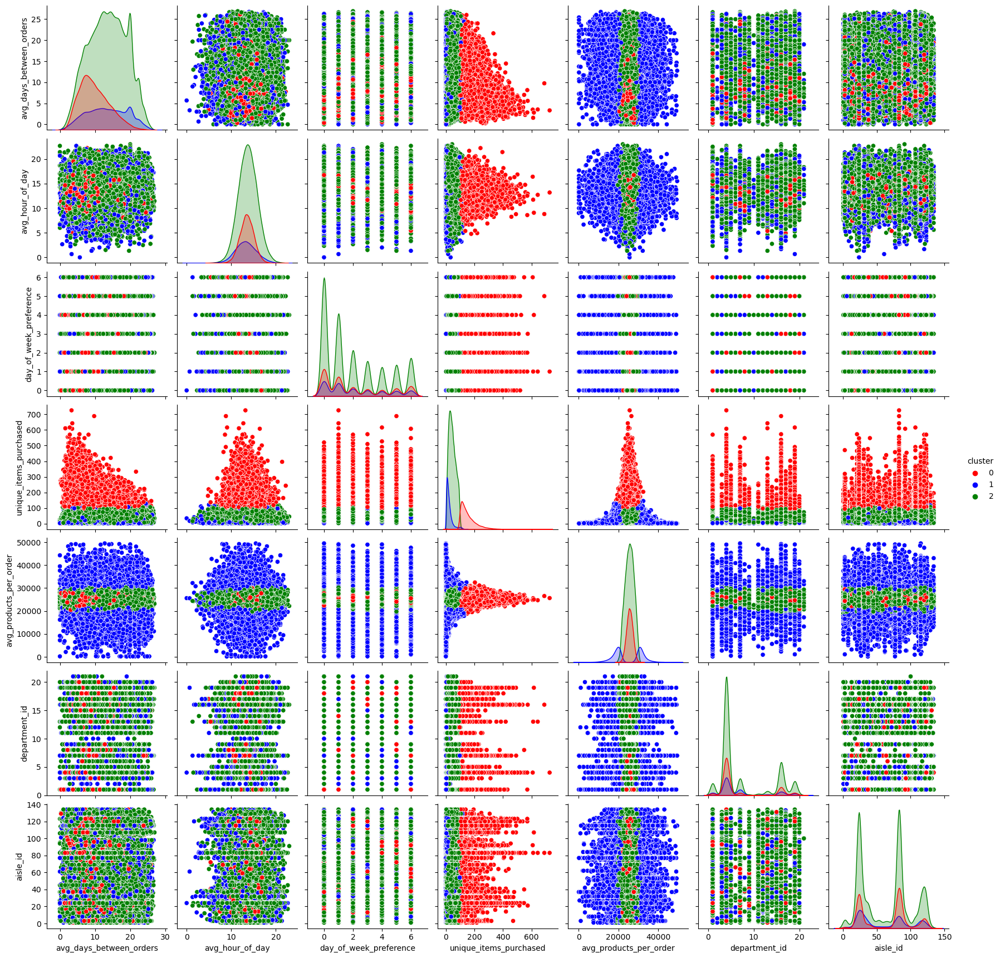

In [32]:
sns.pairplot(gmm1, hue='cluster', palette=['red', 'blue', 'green'])
plt.show()

Here also we see thatfeatures like avg_days_between_orders feature and day of week prefernce feature we cant really cluster the customers,but for example unique item purchased feature we can see better the difference between the clusters,which indicates that this feature may be good for clustring the customers and the the most important features that contribute to the differences between the clusters.

Now to estimate the quality of the clusters created with the gmm-means algorithm, I will use the silhouette score:

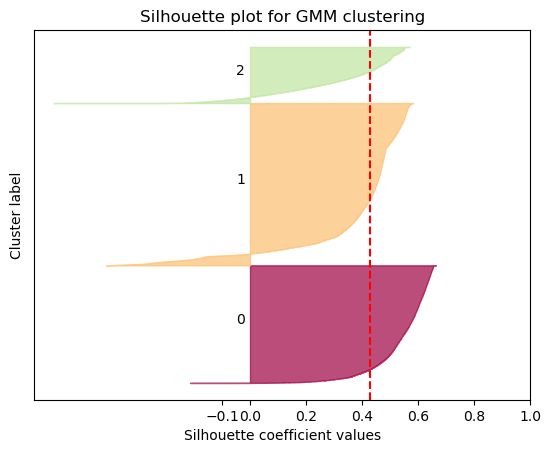

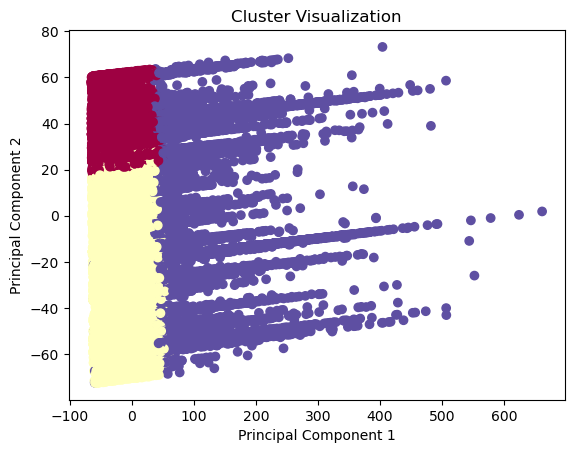

In [85]:
gmm = GaussianMixture(init_params='random', n_components=3, n_init=10,random_state=10)
labels = gmm.fit_predict(gmm1) 

# Compute silhouette scores
silhouette_avg = silhouette_score(k_means1, labels)
sample_silhouette_values = silhouette_samples(k_means1, labels)

# Plot silhouette scores
fig, ax = plt.subplots()
y_lower = 10
for i in range(3):
    ith_cluster_silhouette_values = sample_silhouette_values[labels == i]
    ith_cluster_silhouette_values.sort()
    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i
    color = plt.cm.get_cmap("Spectral")(i / 3)
    ax.fill_betweenx(np.arange(y_lower, y_upper),
                     0, ith_cluster_silhouette_values,
                     facecolor=color, edgecolor=color, alpha=0.7)
    ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
    y_lower = y_upper + 10

ax.set_xlabel("Silhouette coefficient values")
ax.set_ylabel("Cluster label")
ax.axvline(x=silhouette_avg, color="red", linestyle="--")
ax.set_yticks([])
ax.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
plt.title("Silhouette plot for GMM clustering")
plt.show()

# Perform dimensionality reduction for visualization
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(k_means1)

# Plot cluster visualization
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=labels, cmap="Spectral")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("Cluster Visualization")
plt.show()


Here also the silhouette coefficient value of similar to the previous, still indicates a moderate level of separation and compactness of the clusters,and suggests that the clusters are reasonably distinct and relatively well defined.

<h2>Cluster the different products</h2>

In [102]:
products_cluster1=pd.DataFrame()
products_cluster1=pd.merge(products, product_purchase_count1, on=['product_id'], how='inner')
products_cluster1=pd.merge(products_cluster1, AverageprobabilityReorder, on=['product_id'], how='inner')
products_cluster1=pd.merge(products_cluster1, product_Name_Length, on=['product_id'], how='inner')
products_cluster1=pd.merge(products_cluster1, most_common_hour, on=['product_id'], how='inner')
products_cluster1=pd.merge(products_cluster1, df1, on=['product_id'], how='inner')
products_cluster1 = products_cluster1.drop(columns=['category'])
products_cluster1

,product_id,aisle_id,department_id,purchase_count,reorder_rate,Product Name Length,most_common_hour,category_numeric
0,1,61,19,1852,0.613391,26,10,1
1,2,104,13,90,0.133333,16,11,2
2,3,94,7,277,0.732852,36,11,2
3,4,38,1,329,0.446809,65,16,2
4,5,5,13,15,0.600000,25,12,2
...,...,...,...,...,...,...,...,...
49672,49684,124,5,9,0.111111,41,10,2
49673,49685,42,1,49,0.122449,34,15,2
49674,49686,112,3,120,0.700000,16,12,2
49675,49687,41,8,13,0.461538,42,12,2


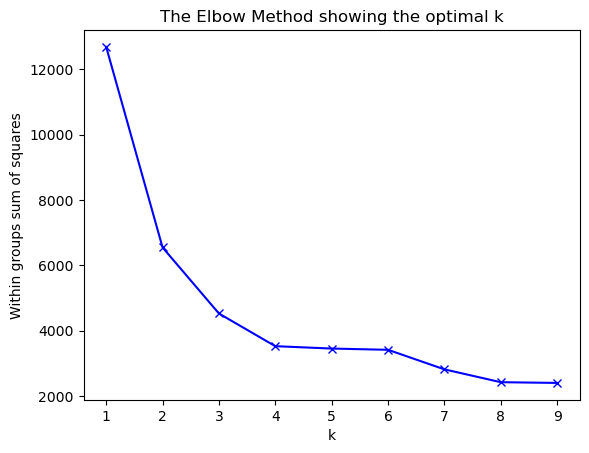

In [103]:
elbow_met(products_cluster1)

We will choose k to be 4 (the elbow value)

<h3>1.Kmeans</h3>

In [105]:
X = products_cluster1[[ 'aisle_id', 'department_id', 'purchase_count', 'reorder_rate','Product Name Length','most_common_hour','category_numeric']]

# Define the parameter grid
param_grid = {
    'n_clusters': [4],
    'init': ['k-means++', 'random'],
    'n_init' : [3,5,8,10],
    'max_iter' : [100, 150, 200]
}

# Create the KMeans estimator
kmeans = KMeans()

# Perform grid search
grid_search = GridSearchCV(kmeans, param_grid, cv=10)
grid_search.fit(X)

# Get the best estimator and its parameters
best_estimator = grid_search.best_estimator_
best_params = grid_search.best_params_

# Print the best parameters
print("Best parameters:", best_params)


Best parameters: {'init': 'random', 'max_iter': 100, 'n_clusters': 4, 'n_init': 3}


In [106]:
preditions_best_km = best_estimator.predict(X)
X['cluster'] = preditions_best_km
X

,aisle_id,department_id,purchase_count,reorder_rate,Product Name Length,most_common_hour,category_numeric,cluster
0,61,19,1852,0.613391,26,10,1,3
1,104,13,90,0.133333,16,11,2,3
2,94,7,277,0.732852,36,11,2,3
3,38,1,329,0.446809,65,16,2,3
4,5,13,15,0.600000,25,12,2,3
...,...,...,...,...,...,...,...,...
49672,124,5,9,0.111111,41,10,2,3
49673,42,1,49,0.122449,34,15,2,3
49674,112,3,120,0.700000,16,12,2,3
49675,41,8,13,0.461538,42,12,2,3


In [107]:
cluster_0 = {}
cluster_1 = {}
cluster_2 = {}
cluster_3 = {}

clusters={}
for i in range(4):
    clusters['cluster_'+str(i)] = X[X['cluster' ]== i]

In [108]:
clusters['cluster_0']

,aisle_id,department_id,purchase_count,reorder_rate,Product Name Length,most_common_hour,category_numeric,cluster
13172,24,4,379450,0.832555,22,10,3,0
21133,24,4,264683,0.777704,20,14,2,0
21899,123,4,241921,0.772500,20,14,4,0
24848,24,4,472565,0.843501,6,10,3,0
47198,24,4,213584,0.796553,20,15,3,0


In [109]:
clusters['cluster_1']

,aisle_id,department_id,purchase_count,reorder_rate,Product Name Length,most_common_hour,category_numeric,cluster
4602,83,4,73167,0.591373,13,12,4,1
4917,123,4,82689,0.667283,19,10,3,1
5074,112,3,60816,0.737207,22,15,2,1
5447,24,4,49021,0.671631,18,15,3,1
5782,84,16,47839,0.805702,27,10,2,1
...,...,...,...,...,...,...,...,...
47615,24,4,152657,0.696038,11,11,3,1
47755,24,4,176815,0.758103,15,13,3,1
48668,83,4,51939,0.662469,33,14,4,1
49224,53,16,76360,0.781456,19,10,2,1


In [110]:
clusters['cluster_2']

,aisle_id,department_id,purchase_count,reorder_rate,Product Name Length,most_common_hour,category_numeric,cluster
44,83,4,18413,0.655461,17,11,4,2
195,77,7,35791,0.776480,4,10,2,2
259,24,4,23900,0.635188,10,14,2,2
310,52,1,8212,0.556990,40,11,2,2
328,84,16,15459,0.798564,28,14,2,2
...,...,...,...,...,...,...,...,...
49164,59,15,10829,0.487764,19,13,2,2
49180,115,7,10365,0.632803,30,10,3,2
49372,83,4,14433,0.529550,19,11,2,2
49509,115,7,14439,0.707805,22,10,3,2


In [112]:
clusters['cluster_3']

,aisle_id,department_id,purchase_count,reorder_rate,Product Name Length,most_common_hour,category_numeric,cluster
0,61,19,1852,0.613391,26,10,1,3
1,104,13,90,0.133333,16,11,2,3
2,94,7,277,0.732852,36,11,2,3
3,38,1,329,0.446809,65,16,2,3
4,5,13,15,0.600000,25,12,2,3
...,...,...,...,...,...,...,...,...
49672,124,5,9,0.111111,41,10,2,3
49673,42,1,49,0.122449,34,15,2,3
49674,112,3,120,0.700000,16,12,2,3
49675,41,8,13,0.461538,42,12,2,3


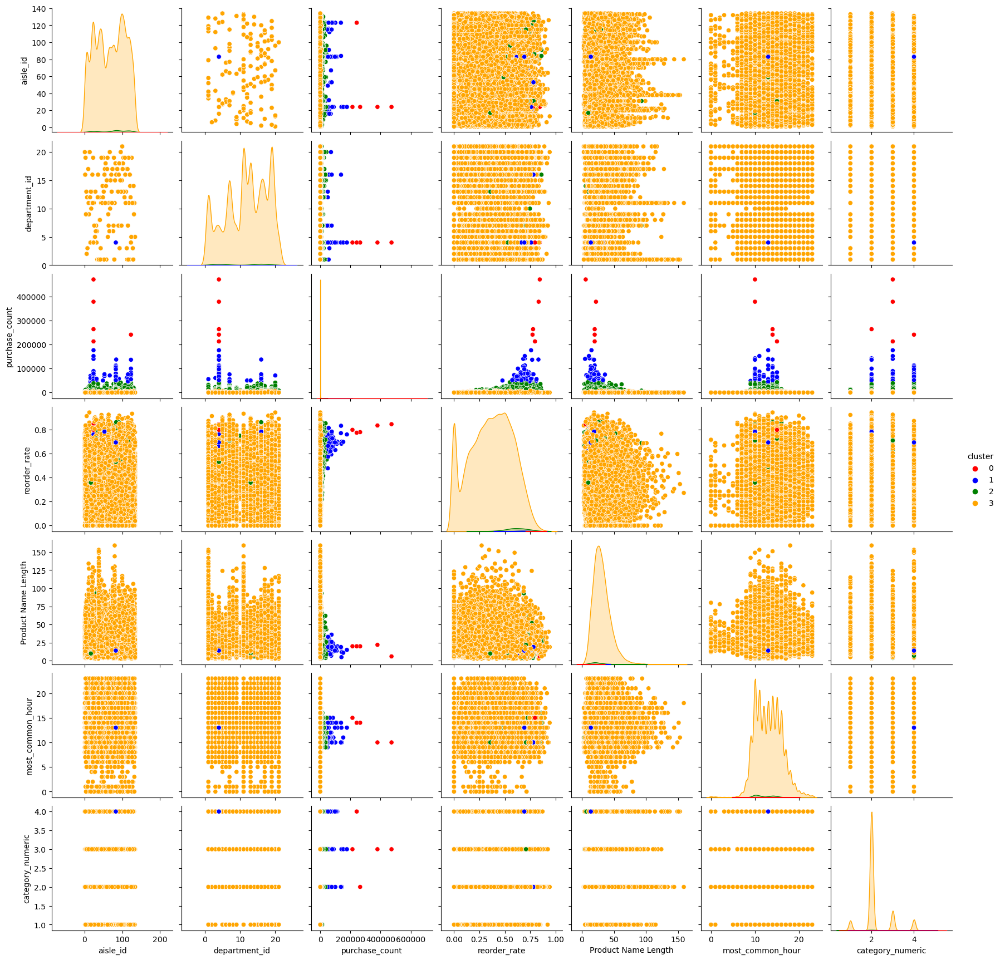

In [114]:
sns.pairplot(X, hue='cluster', palette=['red', 'blue', 'green','orange'])
plt.show()

As we see the purchase_count feature divied the clusters to 4 clusters that we can distinguish between them.
Also we see that most the products in cluster 3 this could represent a specific market segment or product category that is distinct from the others. This could be due to the nature of the products or their intended use, which attracts a specific set of customers.

<h2>2.GMM</h2>

In [118]:
gmm = GaussianMixture(random_state=RSEED)
X = products_cluster1[[ 'aisle_id', 'department_id', 'purchase_count', 'reorder_rate','Product Name Length','most_common_hour','category_numeric']]

# define parameter grid
parameters_grid = {
    'n_components': [4],
    'init_params': ['kmeans', 'k-means++', 'random', 'random_from_data'],
    'n_init' : [1, 3, 5, 8, 10],
    'max_iter' : [100, 150, 200]
}

# define grid search
grid_search = GridSearchCV(estimator=gmm, param_grid=parameters_grid, cv=10)
# fit estimator
grid_search.fit(X)

# get best estimator
best_gmm = grid_search.best_estimator_
print("Best parameters:", best_gmm)

Best parameters: GaussianMixture(init_params='random', n_components=4, n_init=3, random_state=10)


In [119]:
preditions_best_km = best_gmm.predict(X)
preditions_best_km
products_cluster1['cluster'] = preditions_best_km
X['cluster'] = preditions_best_km
products_cluster1

,product_id,aisle_id,department_id,purchase_count,reorder_rate,Product Name Length,most_common_hour,category_numeric,cluster
0,1,61,19,1852,0.613391,26,10,1,1
1,2,104,13,90,0.133333,16,11,2,3
2,3,94,7,277,0.732852,36,11,2,3
3,4,38,1,329,0.446809,65,16,2,3
4,5,5,13,15,0.600000,25,12,2,3
...,...,...,...,...,...,...,...,...,...
49672,49684,124,5,9,0.111111,41,10,2,3
49673,49685,42,1,49,0.122449,34,15,2,3
49674,49686,112,3,120,0.700000,16,12,2,3
49675,49687,41,8,13,0.461538,42,12,2,3


In [120]:
cluster_0 = {}
cluster_1 = {}
cluster_2 = {}
cluster_3 = {}

clusters={}
for i in range(4):
    clusters['cluster_'+str(i)] = X[X['cluster' ]== i]

In [121]:
clusters['cluster_0']

,aisle_id,department_id,purchase_count,reorder_rate,Product Name Length,most_common_hour,category_numeric,cluster
33,121,14,6536,0.600979,20,10,2,0
44,83,4,18413,0.655461,17,11,4,0
147,24,4,4903,0.566592,10,10,2,0
195,77,7,35791,0.776480,4,10,2,0
247,117,19,6371,0.400251,27,15,2,0
...,...,...,...,...,...,...,...,...
49522,17,13,8519,0.357436,10,10,2,0
49593,67,20,5873,0.535501,26,10,2,0
49598,91,16,7226,0.752560,31,10,2,0
49616,120,16,4899,0.661768,17,10,3,0


In [122]:
clusters['cluster_1']

,aisle_id,department_id,purchase_count,reorder_rate,Product Name Length,most_common_hour,category_numeric,cluster
0,61,19,1852,0.613391,26,10,1,1
7,116,1,165,0.503030,33,13,4,1
8,120,16,156,0.525641,33,13,3,1
9,115,7,2572,0.506998,46,11,3,1
11,119,1,246,0.512195,26,18,1,1
...,...,...,...,...,...,...,...,...
49643,98,7,936,0.414530,11,13,3,1
49652,100,21,188,0.478723,30,14,3,1
49655,38,1,1611,0.545003,40,13,2,1
49656,101,17,378,0.507937,30,12,3,1


In [123]:
clusters['cluster_2']

,aisle_id,department_id,purchase_count,reorder_rate,Product Name Length,most_common_hour,category_numeric,cluster
6,98,7,30,0.400000,30,15,3,2
10,31,7,104,0.567308,17,12,3,2
15,103,19,19,0.105263,29,15,1,2
30,123,4,96,0.166667,18,10,4,2
59,9,9,51,0.254902,46,11,4,2
...,...,...,...,...,...,...,...,...
49653,45,19,106,0.500000,45,13,3,2
49659,45,19,65,0.600000,20,8,1,2
49662,37,1,88,0.681818,39,15,1,2
49667,61,19,132,0.303030,23,11,1,2


In [124]:
clusters['cluster_3']

,aisle_id,department_id,purchase_count,reorder_rate,Product Name Length,most_common_hour,category_numeric,cluster
1,104,13,90,0.133333,16,11,2,3
2,94,7,277,0.732852,36,11,2,3
3,38,1,329,0.446809,65,16,2,3
4,5,13,15,0.600000,25,12,2,3
5,11,11,8,0.375000,12,15,2,3
...,...,...,...,...,...,...,...,...
49672,124,5,9,0.111111,41,10,2,3
49673,42,1,49,0.122449,34,15,2,3
49674,112,3,120,0.700000,16,12,2,3
49675,41,8,13,0.461538,42,12,2,3


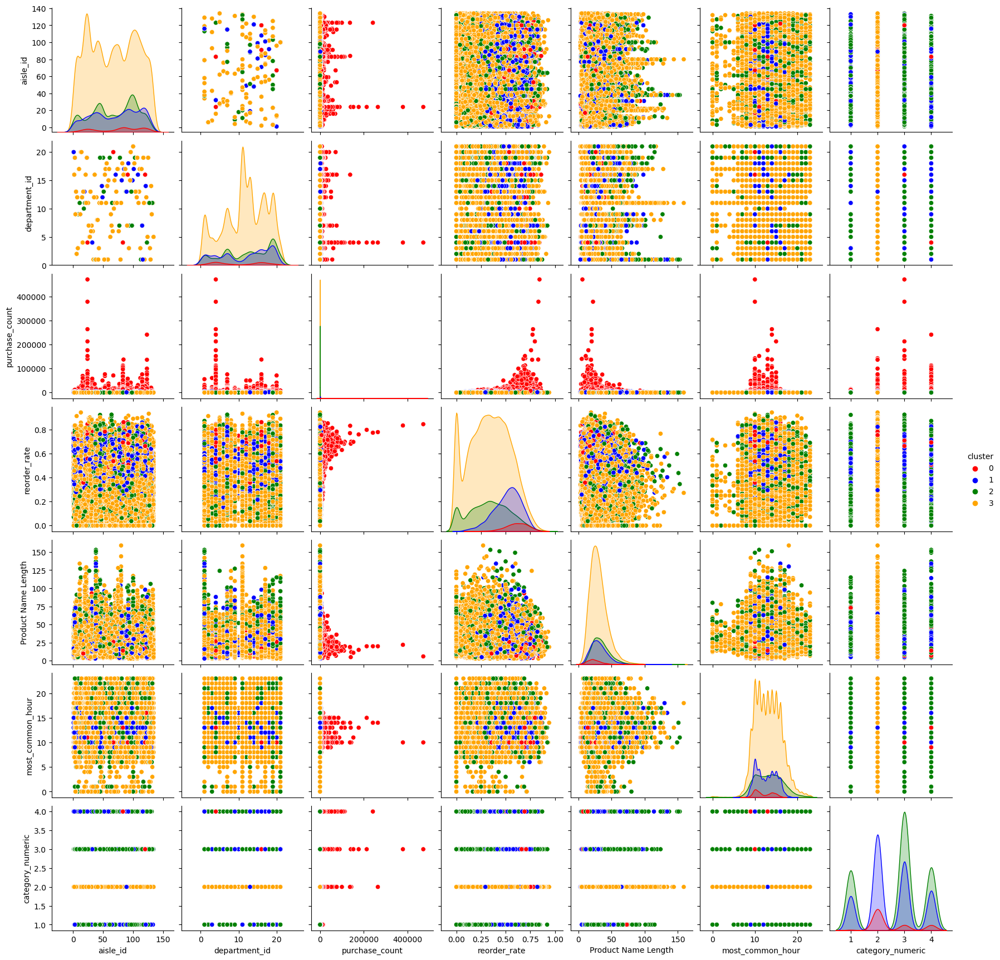

In [125]:
sns.pairplot(X, hue='cluster', palette=['red', 'blue', 'green','orange'])
plt.show()

As we see the purchase_count feature divied the clusters to 4 clusters that we can distinguish between them as before in the k means, so we can conclude that this feature can be good to clustring the products,we can conclude that products can divide into groups when it become to see the count of pepole buy it(same people).
Also we see that most the products in cluster 3 this could also here represent a specific market segment or product category that is distinct from the others.

<h2>Section Section E (Clustering and Dimensions Reduction) </h2>

<h3>Reduce the customers dimensions using PCA algorithm.</h3>

In [29]:
features = custmers_features1.drop('user_id', axis=1)
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

pca = PCA()
pca.fit(scaled_features)


PCA()

To see which principal components explain the majority of the variance in data, here is a plot,that explain the majority of the variance in the data:

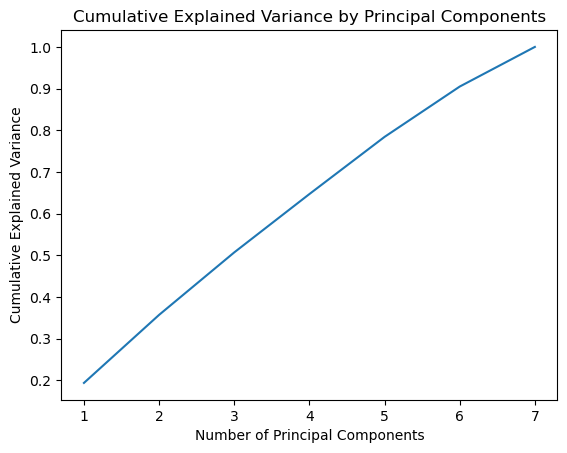

In [30]:
# Calculate cumulative explained variance
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

# Plot cumulative explained variance
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance)
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance by Principal Components')
plt.show()


And to identify the features that are most strongly represented in each component:

In [31]:
loadings = pd.DataFrame(pca.components_, columns=features.columns)

for i, component in enumerate(loadings.index):
    print(f"Principal Component {i+1}:")
    print(loadings.loc[component].sort_values(ascending=False))
    print()


Principal Component 1:
unique_items_purchased     0.681685
avg_products_per_order     0.184746
day_of_week_preference     0.076470
aisle_id                  -0.022025
avg_hour_of_day           -0.078187
department_id             -0.215476
avg_days_between_orders   -0.665055
Name: 0, dtype: float64

Principal Component 2:
department_id              0.667611
aisle_id                   0.613474
day_of_week_preference     0.261003
unique_items_purchased     0.057913
avg_products_per_order    -0.049009
avg_days_between_orders   -0.125946
avg_hour_of_day           -0.296993
Name: 1, dtype: float64

Principal Component 3:
day_of_week_preference     0.454078
department_id             -0.014191
unique_items_purchased    -0.075719
avg_days_between_orders   -0.122218
avg_hour_of_day           -0.441760
aisle_id                  -0.458015
avg_products_per_order    -0.606639
Name: 2, dtype: float64

Principal Component 4:
avg_products_per_order     0.093967
department_id              0.024999
avg_d

Here I use the top principal components to perform clustering on the customers, using the same clustering algorithms as before(K meand +GMM).

<h4>Kmeans:</h4>

In [39]:
# Select the top principal components
n_components = 2  # Choose the number of components to use
top_components = pca.transform(scaled_features)[:, :n_components]

# Perform K-means clustering
kmeans = KMeans(init='random', max_iter=100, n_clusters=3, n_init=3, random_state=10)

kmeans.fit(top_components)
labels = kmeans.labels_

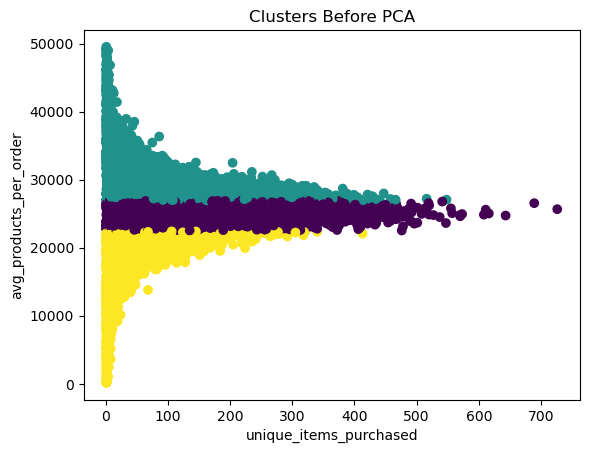

In [66]:
##before PCA
###I have visualize the clusters before PCA in section F whith all the featurses
#but now I will take the 2 featurses that are most strongly represented in each component
plt.scatter(features['unique_items_purchased'], features['avg_products_per_order'], c=k_means1['cluster'])
plt.xlabel('unique_items_purchased')
plt.ylabel('avg_products_per_order')
plt.title('Clusters Before PCA')
plt.show()

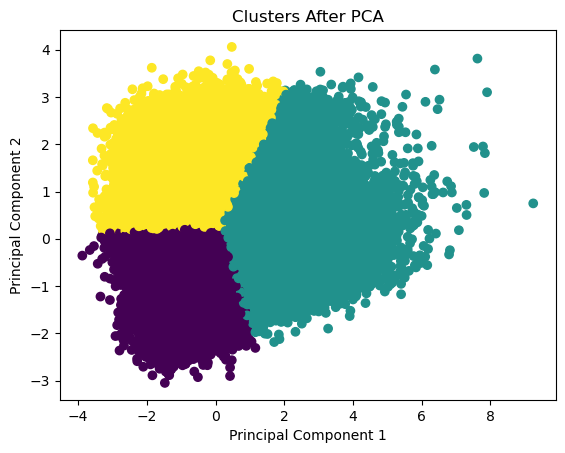

In [40]:
# Visualize clusters after PCA
plt.scatter(top_components[:, 0], top_components[:, 1], c=labels)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Clusters After PCA')
plt.show()

<h4>GMM:<h4>

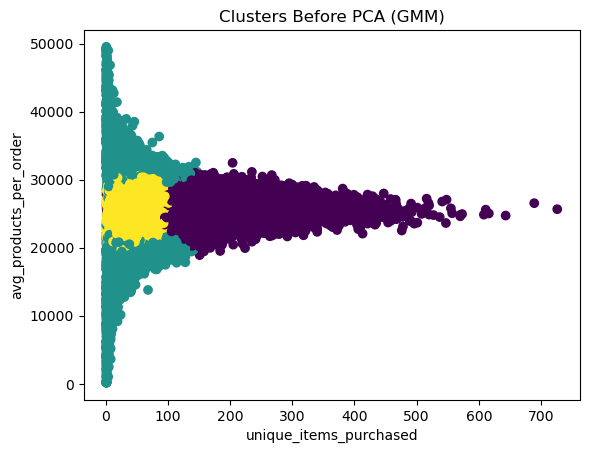

In [68]:
####before PCA
###I have visualize the clusters before PCA in section F whith all the featurses
#but now I will take the 2 featurses that are most strongly represented in each component
plt.scatter(features['unique_items_purchased'], features['avg_products_per_order'], c=gmm1['cluster'])
plt.xlabel('unique_items_purchased')
plt.ylabel('avg_products_per_order')
plt.title('Clusters Before PCA (GMM)')
plt.show()

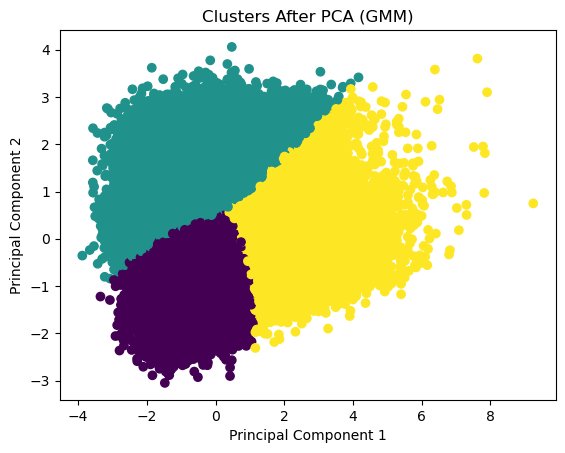

In [41]:
# Select the top principal components
n_components = 2
top_components = pca.transform(scaled_features)[:, :n_components]

# Perform GMM clustering
gmm = GaussianMixture(n_components=3, random_state=RSEED,init_params='random', n_init=10)
gmm.fit(top_components)
labels = gmm.predict(top_components)

# Visualize clusters after PCA
plt.scatter(top_components[:, 0], top_components[:, 1], c=labels)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Clusters After PCA (GMM)')
plt.show()


We know that PCA is a technique used for dimensionality reduction, which is the process of reducing the number of variables in a dataset and by reducing the number of variables, PCA simplifies data analysis, improves performance, and makes it easier to visualize data.
We see that there is a different in the result before and after PCA,after PCA we see the difference between the 3 clusters more.
So  why these differences might exist and how using PCA affects the results of clustering:

*We know that PCA identifies the features that contribute the most to each principal component through loadings, if certain features strongly influence the clusters, PCA can emphasize those features and help form more distinct clusters, However, if the important features are spread across multiple components, it may not capture the true underlying structure effectively, leading to differences in the clusters obtained.

*PCA assumes linear relationships between variables so the clusters obtained after PCA might differ from those obtained without PCA, where the non-linear relationships are preserved.

*PCA reduces the dimensionality of the data by projecting it onto a lower dimensional, this can lead to a loss of information and potentially impact the clustering results.

*About the noise Reduction, PCA can help reduce the impact of noise in the data by focusing on the components with higher variance, and this can potentially improve the clustering results by highlighting the underlying structure, so, the clusters obtained after PCA may be more robust to noise compared to clustering without PCA.

<h1>Section F (Chi-Square test) </h1>

In [14]:
#order_products__train_test dataset is part of train datast so I use left join here and those rows who dont have reorderd value we put 0 beacuse its not reordered
sectionf = pd.merge(train, order_products__train_test[['product_id', 'order_id', 'reordered']], on=['product_id', 'order_id'], how='left')
sectionf["reordered"]=sectionf["reordered"].fillna(0)

In [15]:
# Create a contingency table of the two variables
contingency_table = pd.crosstab(sectionf['reordered'], sectionf['was_in_order'])

# Perform the Chi-Square test
chi2, p_value, _, _ = chi2_contingency(contingency_table)

# Set the significance level (alpha)
alpha = 0.05

# Print the results
print("Chi-Square value:", chi2)
print("p-value:", p_value)

# Compare the p-value with the significance level
if p_value < alpha:
    print("There is a relationship between 'reordered' and 'was_in_order'(Reject null hypothesis).")
else:
    print("There is no relationship between 'reordered' and 'was_in_order'(Accept null hypothesis).")

Chi-Square value: 918097.4611151969
p-value: 0.0
There is a relationship between 'reordered' and 'was_in_order'(Reject null hypothesis).


The Chi-Square test  indicates that there is a relationship between the 'reordered' feature and the 'was_in_order' label. The Chi-Square value of 918097.4611151969 and a p-value of 0.0 suggest that the two variables are not independent, and the null hypothesis can be rejected.

In [16]:
# Perform the Chi-Square test
chi2, p, _, _ = chi2_contingency(contingency_table)

# Calculate the phi coefficient
n = np.sum(contingency_table)
phi = np.sqrt(chi2 / n)

# Print the phi coefficient
print("Phi Coefficient:", phi)


Phi Coefficient: was_in_order
0    0.912691
1    0.973350
dtype: float64


The Phi coefficient ranges from -1 to 1, where:

1 indicates a perfect positive association (both variables have the same pattern of values).
-1 indicates a perfect negative association (the variables have opposite patterns of values).
0 indicates no association (the variables are independent).

The phi coefficient indicates the strength of the relationship, when the value closer to 1 indicates a stronger association. In our case, the phi coefficient values of suggest a relatively strong positive association between the "was_in_order" label and "reordered" feature . This indicates that there is a significant relationship and dependency between them.

So, these results suggest that the 'reordered' feature is significantly related to the 'was_in_order'label and they aren't independent and so can be conseder it as a potentially important predictor for model training.